# **CryptoShield AI**

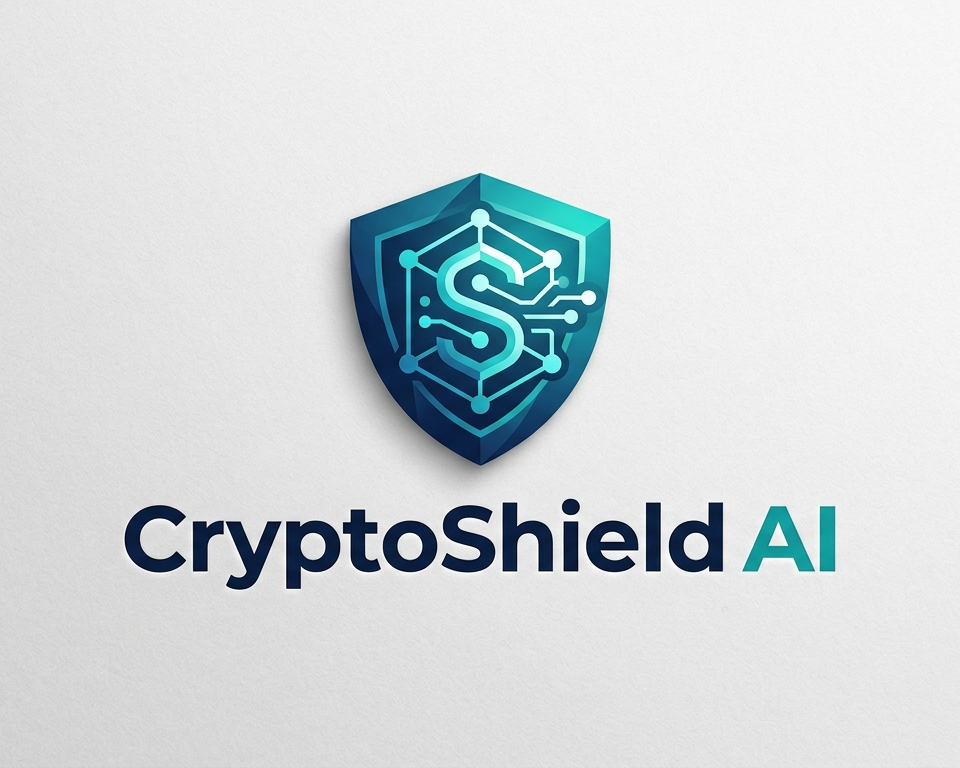

### **Ontología y Razonamiento Semántico (RDFLib y OWL-RL)**

In [74]:
!pip install rdflib
!pip install owlrl
!pip install rdflib


[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


### IMPLEMENTACIÓN DE LA ONTOLOGÍA EN RDF Y RDFS

In [75]:
from rdflib import Graph, RDF, RDFS, Namespace, Literal, XSD
from rdflib.namespace import FOAF, SKOS, DC
from rdflib import Namespace
from rdflib.namespace import RDF, DC, XSD
from rdflib import Graph, RDF, RDFS, Namespace, Literal, URIRef, XSD
from rdflib.namespace import FOAF, SKOS, DC
import owlrl

DCMITYPE = Namespace("http://purl.org/dc/dcmitype/")

# ============================================================
# 0. CREACIÓN DEL GRAFO Y NAMESPACES
# ============================================================
# Exigencia:
# - Implementar la ontología del dominio usando RDF/RDFS.
# - El lenguaje de serialización final será Turtle.
# - Incluir vocabularios aceptados en la literatura: FOAF, Dublin Core, SKOS.

g = Graph()

NS = Namespace("http://unal.edu.co/cripto#")

g.bind("cripto", NS)
g.bind("foaf", FOAF)
g.bind("skos", SKOS)
g.bind("dc", DC)


# ============================================================
# 1. CLASES DE LA ONTOLOGÍA
# ============================================================
# Exigencia:
# - Implementar al menos 10 clases rdfs:Class.
# - Cada clase debe tener rdfs:label explicando su significado.

clases = [
    (
        NS.AlgoritmoCriptografico,
        "Algoritmo criptográfico usado para proteger información mediante cifrado, firma, hash o intercambio de claves."
    ),
    (
        NS.CifradoSimetrico,
        "Algoritmo criptográfico que utiliza una clave compartida para cifrar y descifrar información."
    ),
    (
        NS.CifradoAsimetrico,
        "Algoritmo criptográfico que utiliza un par de claves, generalmente pública y privada."
    ),
    (
        NS.FuncionHash,
        "Algoritmo que produce una huella digital de tamaño fijo a partir de datos de entrada."
    ),
    (
        NS.AlgoritmoPostCuantico,
        "Algoritmo criptográfico diseñado para resistir ataques realizados con computación cuántica."
    ),
    (
        NS.AlgoritmoVulnerable,
        "Algoritmo criptográfico que presenta debilidades conocidas, obsolescencia o inseguridad práctica."
    ),
    (
        NS.ContextoUso,
        "Escenario, entorno o necesidad donde puede aplicarse una solución criptográfica."
    ),
    (
        NS.RecursoLimitado,
        "Contexto de uso con restricciones importantes de memoria, energía o capacidad de procesamiento."
    ),
    (
        NS.InfraestructuraCritica,
        "Contexto de uso donde una falla de seguridad puede afectar servicios esenciales o sistemas de alto impacto."
    ),
    (
        NS.EstadoSeguridad,
        "Categoría que representa el nivel o condición de seguridad de un algoritmo criptográfico."
    )
]

for clase, label in clases:
    g.add((clase, RDF.type, RDFS.Class))
    g.add((clase, RDFS.label, Literal(label, lang="es")))


# ============================================================
# 2. JERARQUÍAS DE CLASES
# ============================================================
# Exigencia:
# - Crear al menos 5 relaciones jerárquicas rdfs:subClassOf.
#


jerarquias_clases = [
    (NS.CifradoSimetrico, NS.AlgoritmoCriptografico),
    (NS.CifradoAsimetrico, NS.AlgoritmoCriptografico),
    (NS.FuncionHash, NS.AlgoritmoCriptografico),
    (NS.AlgoritmoPostCuantico, NS.AlgoritmoCriptografico),
    (NS.AlgoritmoVulnerable, NS.AlgoritmoCriptografico),
    (NS.RecursoLimitado, NS.ContextoUso),
    (NS.InfraestructuraCritica, NS.ContextoUso)
]

for subclase, superclase in jerarquias_clases:
    g.add((subclase, RDFS.subClassOf, superclase))


# ============================================================
# 3. PROPIEDADES RDF CON DOMAIN Y RANGE
# ============================================================
# Exigencia:
# - Crear al menos 10 propiedades RDF originales.
# - Cada propiedad debe tener rdfs:domain y rdfs:range correctamente definidos.
# - Cada propiedad debe tener rdfs:label.
# - Incluir rangos de tipo clase URI y rangos literales con XML-Schema.


propiedades = [
    (NS.esRecomendadoPara,
        "Relaciona un algoritmo criptográfico con un contexto de uso donde resulta adecuado.",
        NS.AlgoritmoCriptografico,
        NS.ContextoUso),
    (NS.usaAlgoritmoRecomendado,
        "Relaciona un contexto de uso con un algoritmo recomendado para ese escenario.",
        NS.ContextoUso,
        NS.AlgoritmoCriptografico),
    (NS.tieneNivelSeguridad,
        "Relaciona un algoritmo criptográfico con su estado o nivel de seguridad.",
        NS.AlgoritmoCriptografico,
        NS.EstadoSeguridad),
    (NS.requiereNivelSeguridad,
        "Indica el nivel de seguridad requerido por un contexto de uso.",
        NS.ContextoUso,
        NS.EstadoSeguridad),
    (NS.esVulnerableA,
        "Describe una vulnerabilidad real o debilidad conocida de un algoritmo.",
        NS.AlgoritmoCriptografico,
        RDFS.Literal),
    (NS.tieneRiesgoCondicional,
        "Describe un riesgo que aparece solo si el algoritmo se implementa o usa incorrectamente.",
        NS.AlgoritmoCriptografico,
        RDFS.Literal),
    (NS.tieneFortalezaSeguridad,
        "Describe una fortaleza de seguridad relevante del algoritmo.",
        NS.AlgoritmoCriptografico,
        RDFS.Literal),
    (NS.utilizaClaveDeTamano,
        "Indica el tamaño de clave utilizado o recomendado por un algoritmo, en bits.",
        NS.AlgoritmoCriptografico,
        XSD.integer),
    (NS.tieneTamanoSalidaBits,
        "Indica el tamaño de salida en bits para funciones hash o firmas.",
        NS.AlgoritmoCriptografico,
        XSD.integer),
    (NS.requiereTamanoClaveMinimo,
        "Indica el tamaño mínimo de clave requerido por un contexto de uso, en bits.",
        NS.ContextoUso,
        XSD.integer),
    (NS.fueEstandarizadoPor,
        "Indica la organización, entidad o estándar asociado al algoritmo.",
        NS.AlgoritmoCriptografico,
        XSD.string),
    (NS.tieneVelocidadEjecucion,
        "Indica una categoría cualitativa de velocidad de ejecución: Alta, Media o Baja.",
        NS.AlgoritmoCriptografico,
        XSD.string),
    (NS.requiereMemoria,
        "Indica una categoría cualitativa de uso de memoria: Alta, Media o Baja.",
        NS.AlgoritmoCriptografico,
        XSD.string),
    (NS.añoDeCreacion,
        "Indica el año de creación, publicación o estandarización del algoritmo.",
        NS.AlgoritmoCriptografico,
        XSD.gYear),
    (NS.tieneLimitacionGeneral,
        "Describe una limitación general del algoritmo o contexto.",
        RDFS.Resource,
        RDFS.Literal),
    (NS.tieneLimitacionTecnica,
        "Describe una limitación técnica específica del algoritmo o contexto.",
        RDFS.Resource,
        RDFS.Literal)
]

for prop, label, dominio, rango in propiedades:
    g.add((prop, RDF.type, RDF.Property))
    g.add((prop, RDFS.label, Literal(label, lang="es")))
    g.add((prop, RDFS.domain, dominio))
    g.add((prop, RDFS.range, rango))


# ============================================================
# 4. JERARQUÍA DE PROPIEDADES
# ============================================================
# Exigencia:
# - Incluir al menos un caso de rdfs:subPropertyOf.
# - Incluir propiedades provenientes de vocabularios aceptados.
#
# Caso 1:
# - Toda limitación técnica también es una limitación general.
#
# Caso 2:
# - fueEstandarizadoPor se relaciona con Dublin Core publisher.
#   Esto permite mostrar uso de vocabulario externo aceptado.

g.add((NS.tieneLimitacionTecnica, RDFS.subPropertyOf, NS.tieneLimitacionGeneral))
g.add((NS.fueEstandarizadoPor, RDFS.subPropertyOf, DC.publisher))


# ============================================================
# 5. INDIVIDUOS DE ESTADO DE SEGURIDAD
# ============================================================
# Exigencia:
# - Instanciar individuos por clase.
#


estados_seguridad = [
    (NS.AltaSeguridad, "Alta seguridad"),
    (NS.SeguridadMedia, "Seguridad media"),
    (NS.BajaSeguridad, "Baja seguridad"),
    (NS.Obsoleto, "Obsoleto"),
    (NS.Vulnerable, "Vulnerable"),
    (NS.PostCuanticoSeguro, "Seguro frente a amenazas cuánticas conocidas")
]

for estado, label in estados_seguridad:
    g.add((estado, RDF.type, NS.EstadoSeguridad))
    g.add((estado, RDFS.label, Literal(label, lang="es")))


# ============================================================
# 6. INDIVIDUOS DE CONTEXTO DE USO
# ============================================================
# Exigencia:
# - Instanciar individuos.
# - Usar rangos de tipo clase URI.
#


contextos_generales = [
    (NS.BancaEnLinea, "Banca en línea"),
    (NS.SistemasHeredados, "Sistemas heredados"),
    (NS.DispositivosMoviles, "Dispositivos móviles"),
    (NS.FirmaDigital, "Firma digital"),
    (NS.AlmacenamientoLargoPlazo, "Almacenamiento a largo plazo"),
    (NS.Blockchain, "Blockchain"),
    (NS.TransmisionTiempoReal, "Transmisión en tiempo real"),
    (NS.AutenticacionUsuarios, "Autenticación de usuarios"),
    (NS.DispositivosIoT, "Dispositivos IoT")
]

for contexto, label in contextos_generales:
    g.add((contexto, RDF.type, NS.ContextoUso))
    g.add((contexto, RDFS.label, Literal(label, lang="es")))


# ============================================================
# 7. INDIVIDUOS DE CIFRADO SIMÉTRICO
# ============================================================
# Exigencia:
# - Instanciar al menos 4 individuos por clase.
#
# Aquí hay 4 individuos de CifradoSimetrico:
# - AES_256
# - DES
# - TDES
# - ChaCha20


# AES-256
g.add((NS.AES_256, RDF.type, NS.CifradoSimetrico))
g.add((NS.AES_256, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.AES_256, RDFS.label, Literal("AES con clave de 256 bits", lang="es")))
g.add((NS.AES_256, SKOS.prefLabel, Literal("AES-256", lang="es")))
g.add((NS.AES_256, NS.esRecomendadoPara, NS.BancaEnLinea))
g.add((NS.AES_256, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.AES_256, NS.tieneRiesgoCondicional, Literal("Puede sufrir ataques de canal lateral si se implementa incorrectamente.", lang="es")))
g.add((NS.AES_256, NS.tieneFortalezaSeguridad, Literal("Cifrado simétrico ampliamente usado y estandarizado para alta seguridad.", lang="es")))
g.add((NS.AES_256, NS.utilizaClaveDeTamano, Literal(256, datatype=XSD.integer)))
g.add((NS.AES_256, NS.fueEstandarizadoPor, Literal("NIST", datatype=XSD.string)))
g.add((NS.AES_256, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.AES_256, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.AES_256, NS.añoDeCreacion, Literal("1998", datatype=XSD.gYear)))
g.add((NS.AES_256, NS.tieneLimitacionTecnica, Literal("Puede requerir AES-NI para máximo rendimiento.", lang="es")))

# DES
g.add((NS.DES, RDF.type, NS.CifradoSimetrico))
g.add((NS.DES, RDF.type, NS.AlgoritmoVulnerable))
g.add((NS.DES, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.DES, RDFS.label, Literal("DES - Estándar de Cifrado de Datos", lang="es")))
g.add((NS.DES, NS.esRecomendadoPara, NS.SistemasHeredados))
g.add((NS.DES, NS.tieneNivelSeguridad, NS.Vulnerable))
g.add((NS.DES, NS.esVulnerableA, Literal("Ataque de fuerza bruta por espacio de claves reducido.", lang="es")))
g.add((NS.DES, NS.utilizaClaveDeTamano, Literal(56, datatype=XSD.integer)))
g.add((NS.DES, NS.fueEstandarizadoPor, Literal("NBS / NIST", datatype=XSD.string)))
g.add((NS.DES, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.DES, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.DES, NS.añoDeCreacion, Literal("1977", datatype=XSD.gYear)))
g.add((NS.DES, NS.tieneLimitacionGeneral, Literal("No debe usarse para proteger información sensible actual.", lang="es")))
g.add((NS.DES, NS.tieneLimitacionTecnica, Literal("Clave de 56 bits insuficiente para hardware moderno.", lang="es")))

# Triple DES
g.add((NS.TDES, RDF.type, NS.CifradoSimetrico))
g.add((NS.TDES, RDF.type, NS.AlgoritmoVulnerable))
g.add((NS.TDES, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.TDES, RDFS.label, Literal("Triple DES", lang="es")))
g.add((NS.TDES, NS.esRecomendadoPara, NS.SistemasHeredados))
g.add((NS.TDES, NS.tieneNivelSeguridad, NS.Obsoleto))
g.add((NS.TDES, NS.esVulnerableA, Literal("Tamaño de bloque pequeño y riesgo en grandes volúmenes de datos.", lang="es")))
g.add((NS.TDES, NS.utilizaClaveDeTamano, Literal(168, datatype=XSD.integer)))
g.add((NS.TDES, NS.fueEstandarizadoPor, Literal("NIST", datatype=XSD.string)))
g.add((NS.TDES, NS.tieneVelocidadEjecucion, Literal("Baja", datatype=XSD.string)))
g.add((NS.TDES, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.TDES, NS.añoDeCreacion, Literal("1998", datatype=XSD.gYear)))
g.add((NS.TDES, NS.tieneLimitacionGeneral, Literal("Algoritmo heredado y menos eficiente que AES.", lang="es")))
g.add((NS.TDES, NS.tieneLimitacionTecnica, Literal("Tamaño de bloque de 64 bits.", lang="es")))

# ChaCha20
g.add((NS.ChaCha20, RDF.type, NS.CifradoSimetrico))
g.add((NS.ChaCha20, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.ChaCha20, RDFS.label, Literal("ChaCha20", lang="es")))
g.add((NS.ChaCha20, NS.esRecomendadoPara, NS.DispositivosMoviles))
g.add((NS.ChaCha20, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.ChaCha20, NS.tieneRiesgoCondicional, Literal("La reutilización del nonce compromete la seguridad.", lang="es")))
g.add((NS.ChaCha20, NS.tieneFortalezaSeguridad, Literal("Buen rendimiento en dispositivos sin aceleración AES.", lang="es")))
g.add((NS.ChaCha20, NS.utilizaClaveDeTamano, Literal(256, datatype=XSD.integer)))
g.add((NS.ChaCha20, NS.fueEstandarizadoPor, Literal("IETF", datatype=XSD.string)))
g.add((NS.ChaCha20, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.ChaCha20, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.ChaCha20, NS.añoDeCreacion, Literal("2008", datatype=XSD.gYear)))
g.add((NS.ChaCha20, NS.tieneLimitacionTecnica, Literal("Requiere manejo correcto de nonces.", lang="es")))


# ============================================================
# 8. INDIVIDUOS DE CIFRADO ASIMÉTRICO
# ============================================================
# Exigencia:
# - 4 individuos para CifradoAsimetrico.
#
# Aquí:
# - RSA_2048
# - RSA_4096
# - ECC_256
# - DiffieHellman

# RSA 2048
g.add((NS.RSA_2048, RDF.type, NS.CifradoAsimetrico))
g.add((NS.RSA_2048, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.RSA_2048, RDFS.label, Literal("RSA con clave de 2048 bits", lang="es")))
g.add((NS.RSA_2048, NS.esRecomendadoPara, NS.FirmaDigital))
g.add((NS.RSA_2048, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.RSA_2048, NS.tieneRiesgoCondicional, Literal("Es vulnerable a computación cuántica de gran escala mediante Shor.", lang="es")))
g.add((NS.RSA_2048, NS.utilizaClaveDeTamano, Literal(2048, datatype=XSD.integer)))
g.add((NS.RSA_2048, NS.fueEstandarizadoPor, Literal("RSA Laboratories / IETF", datatype=XSD.string)))
g.add((NS.RSA_2048, NS.tieneVelocidadEjecucion, Literal("Baja", datatype=XSD.string)))
g.add((NS.RSA_2048, NS.requiereMemoria, Literal("Media", datatype=XSD.string)))
g.add((NS.RSA_2048, NS.añoDeCreacion, Literal("1977", datatype=XSD.gYear)))
g.add((NS.RSA_2048, NS.tieneLimitacionGeneral, Literal("Lento frente al cifrado simétrico.", lang="es")))

# RSA 4096
g.add((NS.RSA_4096, RDF.type, NS.CifradoAsimetrico))
g.add((NS.RSA_4096, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.RSA_4096, RDFS.label, Literal("RSA con clave de 4096 bits", lang="es")))
g.add((NS.RSA_4096, NS.esRecomendadoPara, NS.AlmacenamientoLargoPlazo))
g.add((NS.RSA_4096, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.RSA_4096, NS.tieneRiesgoCondicional, Literal("No es post-cuántico; vulnerable ante computadores cuánticos suficientemente grandes.", lang="es")))
g.add((NS.RSA_4096, NS.utilizaClaveDeTamano, Literal(4096, datatype=XSD.integer)))
g.add((NS.RSA_4096, NS.fueEstandarizadoPor, Literal("NIST / BSI", datatype=XSD.string)))
g.add((NS.RSA_4096, NS.tieneVelocidadEjecucion, Literal("Baja", datatype=XSD.string)))
g.add((NS.RSA_4096, NS.requiereMemoria, Literal("Alta", datatype=XSD.string)))
g.add((NS.RSA_4096, NS.añoDeCreacion, Literal("2002", datatype=XSD.gYear)))
g.add((NS.RSA_4096, NS.tieneLimitacionTecnica, Literal("Descifrado y firma más costosos que RSA-2048.", lang="es")))

# ECC 256
g.add((NS.ECC_256, RDF.type, NS.CifradoAsimetrico))
g.add((NS.ECC_256, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.ECC_256, RDFS.label, Literal("Criptografía de Curva Elíptica de 256 bits", lang="es")))
g.add((NS.ECC_256, NS.esRecomendadoPara, NS.Blockchain))
g.add((NS.ECC_256, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.ECC_256, NS.tieneRiesgoCondicional, Literal("Puede sufrir ataques de canal lateral si la implementación no está protegida.", lang="es")))
g.add((NS.ECC_256, NS.utilizaClaveDeTamano, Literal(256, datatype=XSD.integer)))
g.add((NS.ECC_256, NS.fueEstandarizadoPor, Literal("NIST / SECG", datatype=XSD.string)))
g.add((NS.ECC_256, NS.tieneVelocidadEjecucion, Literal("Media", datatype=XSD.string)))
g.add((NS.ECC_256, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.ECC_256, NS.añoDeCreacion, Literal("1985", datatype=XSD.gYear)))
g.add((NS.ECC_256, NS.tieneLimitacionTecnica, Literal("La seguridad depende de la curva elegida.", lang="es")))

# Diffie-Hellman
g.add((NS.DiffieHellman, RDF.type, NS.CifradoAsimetrico))
g.add((NS.DiffieHellman, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.DiffieHellman, RDFS.label, Literal("Diffie-Hellman", lang="es")))
g.add((NS.DiffieHellman, NS.esRecomendadoPara, NS.TransmisionTiempoReal))
g.add((NS.DiffieHellman, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.DiffieHellman, NS.tieneRiesgoCondicional, Literal("Vulnerable a MitM si no se autentica el intercambio.", lang="es")))
g.add((NS.DiffieHellman, NS.utilizaClaveDeTamano, Literal(2048, datatype=XSD.integer)))
g.add((NS.DiffieHellman, NS.fueEstandarizadoPor, Literal("IETF", datatype=XSD.string)))
g.add((NS.DiffieHellman, NS.tieneVelocidadEjecucion, Literal("Baja", datatype=XSD.string)))
g.add((NS.DiffieHellman, NS.requiereMemoria, Literal("Media", datatype=XSD.string)))
g.add((NS.DiffieHellman, NS.añoDeCreacion, Literal("1976", datatype=XSD.gYear)))
g.add((NS.DiffieHellman, NS.tieneLimitacionGeneral, Literal("No cifra mensajes directamente; sirve para intercambio de claves.", lang="es")))


# ============================================================
# 9. INDIVIDUOS DE FUNCIÓN HASH
# ============================================================
# Exigencia:
# - 4 individuos para FuncionHash.
#


# SHA-256
g.add((NS.SHA_256, RDF.type, NS.FuncionHash))
g.add((NS.SHA_256, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.SHA_256, RDFS.label, Literal("SHA-256", lang="es")))
g.add((NS.SHA_256, NS.esRecomendadoPara, NS.AutenticacionUsuarios))
g.add((NS.SHA_256, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.SHA_256, NS.tieneRiesgoCondicional, Literal("Puede sufrir ataques de extensión de longitud si se usa incorrectamente.", lang="es")))
g.add((NS.SHA_256, NS.tieneTamanoSalidaBits, Literal(256, datatype=XSD.integer)))
g.add((NS.SHA_256, NS.fueEstandarizadoPor, Literal("NIST", datatype=XSD.string)))
g.add((NS.SHA_256, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.SHA_256, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.SHA_256, NS.añoDeCreacion, Literal("2001", datatype=XSD.gYear)))
g.add((NS.SHA_256, NS.tieneLimitacionTecnica, Literal("Diseño basado en Merkle-Damgård.", lang="es")))

# SHA-1
g.add((NS.SHA_1, RDF.type, NS.FuncionHash))
g.add((NS.SHA_1, RDF.type, NS.AlgoritmoVulnerable))
g.add((NS.SHA_1, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.SHA_1, RDFS.label, Literal("SHA-1", lang="es")))
g.add((NS.SHA_1, NS.esRecomendadoPara, NS.SistemasHeredados))
g.add((NS.SHA_1, NS.tieneNivelSeguridad, NS.Vulnerable))
g.add((NS.SHA_1, NS.esVulnerableA, Literal("Ataques de colisión prácticos.", lang="es")))
g.add((NS.SHA_1, NS.tieneTamanoSalidaBits, Literal(160, datatype=XSD.integer)))
g.add((NS.SHA_1, NS.fueEstandarizadoPor, Literal("NIST", datatype=XSD.string)))
g.add((NS.SHA_1, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.SHA_1, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.SHA_1, NS.añoDeCreacion, Literal("1995", datatype=XSD.gYear)))
g.add((NS.SHA_1, NS.tieneLimitacionGeneral, Literal("No se recomienda para firmas digitales modernas.", lang="es")))

# MD5
g.add((NS.MD5, RDF.type, NS.FuncionHash))
g.add((NS.MD5, RDF.type, NS.AlgoritmoVulnerable))
g.add((NS.MD5, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.MD5, RDFS.label, Literal("MD5", lang="es")))
g.add((NS.MD5, NS.esRecomendadoPara, NS.SistemasHeredados))
g.add((NS.MD5, NS.tieneNivelSeguridad, NS.Vulnerable))
g.add((NS.MD5, NS.esVulnerableA, Literal("Colisiones criptográficas prácticas.", lang="es")))
g.add((NS.MD5, NS.tieneTamanoSalidaBits, Literal(128, datatype=XSD.integer)))
g.add((NS.MD5, NS.fueEstandarizadoPor, Literal("IETF", datatype=XSD.string)))
g.add((NS.MD5, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.MD5, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.MD5, NS.añoDeCreacion, Literal("1991", datatype=XSD.gYear)))
g.add((NS.MD5, NS.tieneLimitacionGeneral, Literal("Criptográficamente roto para seguridad moderna.", lang="es")))

# SHA-3
g.add((NS.SHA_3, RDF.type, NS.FuncionHash))
g.add((NS.SHA_3, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.SHA_3, RDFS.label, Literal("SHA-3", lang="es")))
g.add((NS.SHA_3, NS.esRecomendadoPara, NS.Blockchain))
g.add((NS.SHA_3, NS.tieneNivelSeguridad, NS.AltaSeguridad))
g.add((NS.SHA_3, NS.tieneFortalezaSeguridad, Literal("Diseño de esponja resistente a ataques conocidos contra SHA-2.", lang="es")))
g.add((NS.SHA_3, NS.tieneTamanoSalidaBits, Literal(512, datatype=XSD.integer)))
g.add((NS.SHA_3, NS.fueEstandarizadoPor, Literal("NIST", datatype=XSD.string)))
g.add((NS.SHA_3, NS.tieneVelocidadEjecucion, Literal("Media", datatype=XSD.string)))
g.add((NS.SHA_3, NS.requiereMemoria, Literal("Media", datatype=XSD.string)))
g.add((NS.SHA_3, NS.añoDeCreacion, Literal("2015", datatype=XSD.gYear)))
g.add((NS.SHA_3, NS.tieneLimitacionTecnica, Literal("Puede ser más lento que SHA-2 en algunos entornos.", lang="es")))


# ============================================================
# 10. INDIVIDUOS DE ALGORITMO POST-CUÁNTICO
# ============================================================
# Exigencia:
# - 4 individuos para AlgoritmoPostCuantico.
#
# Aquí:
# - Kyber
# - Dilithium
# - SphincsPlus
# - Falcon

# Kyber
g.add((NS.Kyber, RDF.type, NS.AlgoritmoPostCuantico))
g.add((NS.Kyber, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.Kyber, RDFS.label, Literal("CRYSTALS-Kyber", lang="es")))
g.add((NS.Kyber, NS.esRecomendadoPara, NS.InfraestructuraCritica))
g.add((NS.Kyber, NS.tieneNivelSeguridad, NS.PostCuanticoSeguro))
g.add((NS.Kyber, NS.tieneRiesgoCondicional, Literal("Puede sufrir ataques de canal lateral en implementaciones físicas.", lang="es")))
g.add((NS.Kyber, NS.tieneFortalezaSeguridad, Literal("Diseñado para intercambio de claves resistente a amenazas cuánticas.", lang="es")))
g.add((NS.Kyber, NS.utilizaClaveDeTamano, Literal(1632, datatype=XSD.integer)))
g.add((NS.Kyber, NS.fueEstandarizadoPor, Literal("NIST FIPS 203", datatype=XSD.string)))
g.add((NS.Kyber, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.Kyber, NS.requiereMemoria, Literal("Media", datatype=XSD.string)))
g.add((NS.Kyber, NS.añoDeCreacion, Literal("2024", datatype=XSD.gYear)))
g.add((NS.Kyber, NS.tieneLimitacionTecnica, Literal("Basado en problemas de redes/lattices.", lang="es")))

# Dilithium
g.add((NS.Dilithium, RDF.type, NS.AlgoritmoPostCuantico))
g.add((NS.Dilithium, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.Dilithium, RDFS.label, Literal("CRYSTALS-Dilithium", lang="es")))
g.add((NS.Dilithium, NS.esRecomendadoPara, NS.FirmaDigital))
g.add((NS.Dilithium, NS.tieneNivelSeguridad, NS.PostCuanticoSeguro))
g.add((NS.Dilithium, NS.tieneFortalezaSeguridad, Literal("Firma digital resistente a ataques cuánticos conocidos.", lang="es")))
g.add((NS.Dilithium, NS.utilizaClaveDeTamano, Literal(2592, datatype=XSD.integer)))
g.add((NS.Dilithium, NS.fueEstandarizadoPor, Literal("NIST FIPS 204", datatype=XSD.string)))
g.add((NS.Dilithium, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.Dilithium, NS.requiereMemoria, Literal("Media", datatype=XSD.string)))
g.add((NS.Dilithium, NS.añoDeCreacion, Literal("2024", datatype=XSD.gYear)))
g.add((NS.Dilithium, NS.tieneLimitacionTecnica, Literal("Firmas más grandes que ECDSA o RSA.", lang="es")))

# SPHINCS+
g.add((NS.SphincsPlus, RDF.type, NS.AlgoritmoPostCuantico))
g.add((NS.SphincsPlus, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.SphincsPlus, RDFS.label, Literal("SPHINCS+", lang="es")))
g.add((NS.SphincsPlus, NS.esRecomendadoPara, NS.AlmacenamientoLargoPlazo))
g.add((NS.SphincsPlus, NS.tieneNivelSeguridad, NS.PostCuanticoSeguro))
g.add((NS.SphincsPlus, NS.tieneFortalezaSeguridad, Literal("Firma basada en hash, útil como alternativa conservadora a largo plazo.", lang="es")))
g.add((NS.SphincsPlus, NS.utilizaClaveDeTamano, Literal(32, datatype=XSD.integer)))
g.add((NS.SphincsPlus, NS.fueEstandarizadoPor, Literal("NIST FIPS 205", datatype=XSD.string)))
g.add((NS.SphincsPlus, NS.tieneVelocidadEjecucion, Literal("Baja", datatype=XSD.string)))
g.add((NS.SphincsPlus, NS.requiereMemoria, Literal("Alta", datatype=XSD.string)))
g.add((NS.SphincsPlus, NS.añoDeCreacion, Literal("2024", datatype=XSD.gYear)))
g.add((NS.SphincsPlus, NS.tieneLimitacionTecnica, Literal("Generación de firma computacionalmente costosa.", lang="es")))

# Falcon
g.add((NS.Falcon, RDF.type, NS.AlgoritmoPostCuantico))
g.add((NS.Falcon, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.Falcon, RDFS.label, Literal("Falcon", lang="es")))
g.add((NS.Falcon, NS.esRecomendadoPara, NS.DispositivosIoT))
g.add((NS.Falcon, NS.tieneNivelSeguridad, NS.PostCuanticoSeguro))
g.add((NS.Falcon, NS.tieneRiesgoCondicional, Literal("Implementación compleja por uso de aritmética de punto flotante.", lang="es")))
g.add((NS.Falcon, NS.tieneFortalezaSeguridad, Literal("Firmas compactas útiles cuando el ancho de banda es limitado.", lang="es")))
g.add((NS.Falcon, NS.utilizaClaveDeTamano, Literal(897, datatype=XSD.integer)))
g.add((NS.Falcon, NS.fueEstandarizadoPor, Literal("NIST", datatype=XSD.string)))
g.add((NS.Falcon, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.Falcon, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.Falcon, NS.añoDeCreacion, Literal("2024", datatype=XSD.gYear)))
g.add((NS.Falcon, NS.tieneLimitacionTecnica, Literal("Difícil de implementar correctamente en hardware limitado.", lang="es")))


# ============================================================
# 11. INDIVIDUOS DE RECURSO LIMITADO
# ============================================================
# Exigencia:
# - 4 individuos para RecursoLimitado.
#


# Sensor IoT
g.add((NS.SensorIoT_Temp, RDF.type, NS.RecursoLimitado))
g.add((NS.SensorIoT_Temp, RDFS.label, Literal("Sensor IoT de temperatura", lang="es")))
g.add((NS.SensorIoT_Temp, NS.usaAlgoritmoRecomendado, NS.ChaCha20))
g.add((NS.SensorIoT_Temp, NS.requiereNivelSeguridad, NS.AltaSeguridad))
g.add((NS.SensorIoT_Temp, NS.requiereTamanoClaveMinimo, Literal(128, datatype=XSD.integer)))
g.add((NS.SensorIoT_Temp, NS.tieneLimitacionTecnica, Literal("Batería limitada y CPU de baja potencia.", lang="es")))
g.add((NS.SensorIoT_Temp, NS.tieneLimitacionGeneral, Literal("No soporta algoritmos asimétricos pesados.", lang="es")))

# SmartCard
g.add((NS.SmartCard_NFC, RDF.type, NS.RecursoLimitado))
g.add((NS.SmartCard_NFC, RDFS.label, Literal("Tarjeta inteligente NFC", lang="es")))
g.add((NS.SmartCard_NFC, NS.usaAlgoritmoRecomendado, NS.ECC_256))
g.add((NS.SmartCard_NFC, NS.requiereNivelSeguridad, NS.AltaSeguridad))
g.add((NS.SmartCard_NFC, NS.requiereTamanoClaveMinimo, Literal(128, datatype=XSD.integer)))
g.add((NS.SmartCard_NFC, NS.tieneLimitacionTecnica, Literal("Memoria EEPROM reducida.", lang="es")))
g.add((NS.SmartCard_NFC, NS.tieneLimitacionGeneral, Literal("Exposición a ataques físicos y de canal lateral.", lang="es")))

# Marcapasos conectado
g.add((NS.Marcapasos_Conectado, RDF.type, NS.RecursoLimitado))
g.add((NS.Marcapasos_Conectado, RDFS.label, Literal("Marcapasos conectado", lang="es")))
g.add((NS.Marcapasos_Conectado, NS.usaAlgoritmoRecomendado, NS.AES_256))
g.add((NS.Marcapasos_Conectado, NS.requiereNivelSeguridad, NS.AltaSeguridad))
g.add((NS.Marcapasos_Conectado, NS.requiereTamanoClaveMinimo, Literal(128, datatype=XSD.integer)))
g.add((NS.Marcapasos_Conectado, NS.tieneLimitacionTecnica, Literal("Ciclos de CPU limitados para evitar consumo excesivo.", lang="es")))
g.add((NS.Marcapasos_Conectado, NS.tieneLimitacionGeneral, Literal("La duración de la batería es crítica.", lang="es")))

# Router heredado
g.add((NS.Router_Legacy, RDF.type, NS.RecursoLimitado))
g.add((NS.Router_Legacy, RDFS.label, Literal("Router doméstico antiguo", lang="es")))
g.add((NS.Router_Legacy, NS.usaAlgoritmoRecomendado, NS.ChaCha20))
g.add((NS.Router_Legacy, NS.requiereNivelSeguridad, NS.SeguridadMedia))
g.add((NS.Router_Legacy, NS.requiereTamanoClaveMinimo, Literal(128, datatype=XSD.integer)))
g.add((NS.Router_Legacy, NS.tieneLimitacionTecnica, Literal("Memoria RAM y CPU limitadas.", lang="es")))
g.add((NS.Router_Legacy, NS.tieneLimitacionGeneral, Literal("Dificultad para soportar protocolos modernos.", lang="es")))


# ============================================================
# 12. INDIVIDUOS DE INFRAESTRUCTURA CRÍTICA
# ============================================================
# Exigencia:
# - 4 individuos para InfraestructuraCritica.

# Central eléctrica
g.add((NS.Central_Electrica, RDF.type, NS.InfraestructuraCritica))
g.add((NS.Central_Electrica, RDFS.label, Literal("Central eléctrica inteligente", lang="es")))
g.add((NS.Central_Electrica, NS.usaAlgoritmoRecomendado, NS.AES_256))
g.add((NS.Central_Electrica, NS.requiereNivelSeguridad, NS.AltaSeguridad))
g.add((NS.Central_Electrica, NS.requiereTamanoClaveMinimo, Literal(256, datatype=XSD.integer)))
g.add((NS.Central_Electrica, NS.tieneLimitacionTecnica, Literal("Requiere baja latencia para control industrial.", lang="es")))
g.add((NS.Central_Electrica, NS.tieneLimitacionGeneral, Literal("Impacto alto sobre servicios esenciales.", lang="es")))

# Planta de agua
g.add((NS.Planta_Agua, RDF.type, NS.InfraestructuraCritica))
g.add((NS.Planta_Agua, RDFS.label, Literal("Planta de tratamiento de agua", lang="es")))
g.add((NS.Planta_Agua, NS.usaAlgoritmoRecomendado, NS.RSA_4096))
g.add((NS.Planta_Agua, NS.requiereNivelSeguridad, NS.AltaSeguridad))
g.add((NS.Planta_Agua, NS.requiereTamanoClaveMinimo, Literal(256, datatype=XSD.integer)))
g.add((NS.Planta_Agua, NS.tieneLimitacionTecnica, Literal("Hardware industrial con ciclos de vida largos.", lang="es")))
g.add((NS.Planta_Agua, NS.tieneLimitacionGeneral, Literal("Difícil actualización de algoritmos en sitio.", lang="es")))

# Satélite gubernamental
g.add((NS.Satelite_Gob, RDF.type, NS.InfraestructuraCritica))
g.add((NS.Satelite_Gob, RDFS.label, Literal("Satélite de comunicaciones gubernamental", lang="es")))
g.add((NS.Satelite_Gob, NS.usaAlgoritmoRecomendado, NS.Kyber))
g.add((NS.Satelite_Gob, NS.requiereNivelSeguridad, NS.PostCuanticoSeguro))
g.add((NS.Satelite_Gob, NS.requiereTamanoClaveMinimo, Literal(256, datatype=XSD.integer)))
g.add((NS.Satelite_Gob, NS.tieneLimitacionTecnica, Literal("No puede intervenirse físicamente luego del lanzamiento.", lang="es")))
g.add((NS.Satelite_Gob, NS.tieneLimitacionGeneral, Literal("Requiere protección de largo plazo frente a amenazas futuras.", lang="es")))

# Control ferroviario
g.add((NS.Control_Ferroviario, RDF.type, NS.InfraestructuraCritica))
g.add((NS.Control_Ferroviario, RDFS.label, Literal("Sistema de control ferroviario", lang="es")))
g.add((NS.Control_Ferroviario, NS.usaAlgoritmoRecomendado, NS.SHA_3))
g.add((NS.Control_Ferroviario, NS.requiereNivelSeguridad, NS.AltaSeguridad))
g.add((NS.Control_Ferroviario, NS.requiereTamanoClaveMinimo, Literal(256, datatype=XSD.integer)))
g.add((NS.Control_Ferroviario, NS.tieneLimitacionTecnica, Literal("Debe coexistir con protocolos industriales heredados.", lang="es")))
g.add((NS.Control_Ferroviario, NS.tieneLimitacionGeneral, Literal("Fallas de integridad pueden causar accidentes graves.", lang="es")))


# ============================================================
# 13. INDIVIDUOS EXTRA DE ALGORITMO VULNERABLE
# ============================================================
# Exigencia:
# - 4 individuos para AlgoritmoVulnerable.
#
# Ya DES, TDES, SHA_1 y MD5 fueron declarados como AlgoritmoVulnerable.
# Aquí se agregan escenarios adicionales de vulnerabilidad para fortalecer
# la ontología y evitar que la clase quede pobre.

g.add((NS.RC4, RDF.type, NS.AlgoritmoVulnerable))
g.add((NS.RC4, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.RC4, RDFS.label, Literal("RC4", lang="es")))
g.add((NS.RC4, NS.esRecomendadoPara, NS.SistemasHeredados))
g.add((NS.RC4, NS.tieneNivelSeguridad, NS.Vulnerable))
g.add((NS.RC4, NS.esVulnerableA, Literal("Sesgos estadísticos en el flujo de claves.", lang="es")))
g.add((NS.RC4, NS.utilizaClaveDeTamano, Literal(128, datatype=XSD.integer)))
g.add((NS.RC4, NS.tieneVelocidadEjecucion, Literal("Alta", datatype=XSD.string)))
g.add((NS.RC4, NS.requiereMemoria, Literal("Baja", datatype=XSD.string)))
g.add((NS.RC4, NS.añoDeCreacion, Literal("1987", datatype=XSD.gYear)))
g.add((NS.RC4, NS.tieneLimitacionGeneral, Literal("No recomendado para TLS moderno.", lang="es")))

g.add((NS.RSA_1024, RDF.type, NS.AlgoritmoVulnerable))
g.add((NS.RSA_1024, RDF.type, NS.AlgoritmoCriptografico))
g.add((NS.RSA_1024, RDFS.label, Literal("RSA con clave de 1024 bits", lang="es")))
g.add((NS.RSA_1024, NS.esRecomendadoPara, NS.SistemasHeredados))
g.add((NS.RSA_1024, NS.tieneNivelSeguridad, NS.Vulnerable))
g.add((NS.RSA_1024, NS.esVulnerableA, Literal("Tamaño de clave insuficiente para seguridad moderna.", lang="es")))
g.add((NS.RSA_1024, NS.utilizaClaveDeTamano, Literal(1024, datatype=XSD.integer)))
g.add((NS.RSA_1024, NS.tieneVelocidadEjecucion, Literal("Media", datatype=XSD.string)))
g.add((NS.RSA_1024, NS.requiereMemoria, Literal("Media", datatype=XSD.string)))
g.add((NS.RSA_1024, NS.añoDeCreacion, Literal("1990", datatype=XSD.gYear)))
g.add((NS.RSA_1024, NS.tieneLimitacionGeneral, Literal("No cumple recomendaciones modernas de seguridad.", lang="es")))


# ============================================================
# 14. METADATOS DE LA ONTOLOGÍA
# ============================================================
# Exigencia:
# - Uso de vocabularios aceptados.
#
# Aquí se usa Dublin Core para describir la ontología como recurso.

# Se usa DCMITYPE.Dataset porque esta ontología se está describiendo como un recurso
# de tipo "Dataset" dentro del vocabulario Dublin Core Metadata Initiative.
# DC se reserva para propiedades descriptivas como title, creator o description,
# mientras que DCMITYPE permite indicar formalmente la naturaleza del recurso.

g.add((NS.OntologiaCripto, RDF.type, DCMITYPE.Dataset))
g.add((NS.OntologiaCripto, DC.title, Literal("Ontología de algoritmos criptográficos y contextos de uso", lang="es")))
g.add((NS.OntologiaCripto, DC.creator, Literal("Proyecto académico de sistema experto criptográfico", lang="es")))
g.add((NS.OntologiaCripto, DC.language, Literal("es", datatype=XSD.string)))
g.add((NS.OntologiaCripto, DC.description, Literal(
    "Ontología RDF/RDFS para representar algoritmos criptográficos, estados de seguridad, contextos de uso, vulnerabilidades, riesgos condicionales y recomendaciones.",
    lang="es"
)))


# ============================================================
# 15. VERIFICACIÓN SIMPLE SIN RAZONAMIENTO
# ============================================================
# Todavía NO se aplica OWL-RL ni DeductiveClosure.
# Esto solo muestra el grafo construido de base.

print("Triples creados antes de razonamiento:", len(g))


# ============================================================
# 16. EXPORTACIÓN EN TURTLE
# ============================================================
# Exigencia:
# - El lenguaje de serialización de la ontología final será Turtle.

g.serialize(destination="cripto_ontologia.ttl", format="turtle")
print("Ontología exportada exitosamente a 'cripto_ontologia.ttl'")

print("\n--- Vista previa Turtle ---\n")
print(g.serialize(format="turtle"))

Triples creados antes de razonamiento: 409
Ontología exportada exitosamente a 'cripto_ontologia.ttl'

--- Vista previa Turtle ---

@prefix cripto: <http://unal.edu.co/cripto#> .
@prefix dc: <http://purl.org/dc/elements/1.1/> .
@prefix dcmitype: <http://purl.org/dc/dcmitype/> .
@prefix rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#> .
@prefix rdfs: <http://www.w3.org/2000/01/rdf-schema#> .
@prefix skos: <http://www.w3.org/2004/02/skos/core#> .
@prefix xsd: <http://www.w3.org/2001/XMLSchema#> .

cripto:AlgoritmoCriptografico a rdfs:Class ;
    rdfs:label "Algoritmo criptográfico usado para proteger información mediante cifrado, firma, hash o intercambio de claves."@es .

cripto:AlgoritmoPostCuantico a rdfs:Class ;
    rdfs:label "Algoritmo criptográfico diseñado para resistir ataques realizados con computación cuántica."@es ;
    rdfs:subClassOf cripto:AlgoritmoCriptografico .

cripto:AlgoritmoVulnerable a rdfs:Class ;
    rdfs:label "Algoritmo criptográfico que presenta debilidades c

### Inferencia / Razonamiento con DeductiveClosure(owlrl.RDFS_Semantics)

In [76]:
# Comparar el grafo antes y después del razonamiento.

grafo_original = Graph()

for prefix, namespace in g.namespaces():
    grafo_original.bind(prefix, namespace)

for triple in g:
    grafo_original.add(triple)

tripletas_antes = len(grafo_original)

In [77]:
# Requerimiento: Aplicar razonamiento RDFS usando DeductiveClosure(RDFS_Semantics).

owlrl.DeductiveClosure(
    owlrl.RDFS_Semantics,
    axiomatic_triples=False,
    datatype_axioms=False
).expand(g)

tripletas_despues = len(g)
nuevos_hechos = g - grafo_original

print("Inferencia aplicada con OWL-RL.")
print(f"Tripletas antes:   {tripletas_antes}")
print(f"Tripletas después: {tripletas_despues}")
print(f"Tripletas nuevas:  {len(nuevos_hechos)}")

Inferencia aplicada con OWL-RL.
Tripletas antes:   409
Tripletas después: 855
Tripletas nuevas:  446


In [78]:
# Facilita la lectura de triples inferidos.

def bonito(valor, graph=g):
    if isinstance(valor, Literal):
        return valor.n3(graph.namespace_manager)
    try:
        return graph.namespace_manager.normalizeUri(valor)
    except Exception:
        return str(valor)


def tripleta_txt(triple, graph=g):
    s, p, o = triple
    return f"{bonito(s, graph)} {bonito(p, graph)} {bonito(o, graph)}"


def es_del_dominio(uri):
    return isinstance(uri, URIRef) and str(uri).startswith(str(NS))


def filtrar_ruido(triple):
    s, p, o = triple

    if not es_del_dominio(s):
        return False

    if s == o:
        return False

    if p == RDF.type and o == RDFS.Resource:
        return False

    if p == RDFS.subClassOf and o == RDFS.Resource:
        return False

    if p == RDFS.subPropertyOf and s == o:
        return False

    return True

#### Serialización en Turtle

In [79]:
# Requerimiento: serializar la ontología final en Turtle.

print(g.serialize(format="turtle"))

@prefix cripto: <http://unal.edu.co/cripto#> .
@prefix dc: <http://purl.org/dc/elements/1.1/> .
@prefix dcmitype: <http://purl.org/dc/dcmitype/> .
@prefix rdf: <http://www.w3.org/1999/02/22-rdf-syntax-ns#> .
@prefix rdfs: <http://www.w3.org/2000/01/rdf-schema#> .
@prefix skos: <http://www.w3.org/2004/02/skos/core#> .
@prefix xsd: <http://www.w3.org/2001/XMLSchema#> .

cripto:AlgoritmoCriptografico a rdfs:Class,
        rdfs:Resource ;
    rdfs:label "Algoritmo criptográfico usado para proteger información mediante cifrado, firma, hash o intercambio de claves."@es ;
    rdfs:subClassOf cripto:AlgoritmoCriptografico,
        rdfs:Resource .

cripto:AlgoritmoPostCuantico a rdfs:Class,
        rdfs:Resource ;
    rdfs:label "Algoritmo criptográfico diseñado para resistir ataques realizados con computación cuántica."@es ;
    rdfs:subClassOf cripto:AlgoritmoCriptografico,
        cripto:AlgoritmoPostCuantico,
        rdfs:Resource .

cripto:AlgoritmoVulnerable a rdfs:Class,
        rdfs:Res

#### Grafo Antes vs Después del razonamiento

In [80]:
# Requerimiento: comparar el grafo antes y después del razonamiento.

print("COMPARACIÓN DEL GRAFO")
print("-" * 80)
print(f"Tripletas antes del razonamiento:   {tripletas_antes}")
print(f"Tripletas después del razonamiento: {tripletas_despues}")
print(f"Tripletas nuevas inferidas:         {len(nuevos_hechos)}")

print("\nPRIMERAS TRIPLETAS NUEVAS:")
print("-" * 80)

for i, triple in enumerate(sorted(nuevos_hechos, key=tripleta_txt), start=1):
    if filtrar_ruido(triple):
        print(f"{i}. {tripleta_txt(triple)}")

COMPARACIÓN DEL GRAFO
--------------------------------------------------------------------------------
Tripletas antes del razonamiento:   409
Tripletas después del razonamiento: 855
Tripletas nuevas inferidas:         446

PRIMERAS TRIPLETAS NUEVAS:
--------------------------------------------------------------------------------
265. cripto:AES_256 cripto:tieneLimitacionGeneral "Puede requerir AES-NI para máximo rendimiento."@es
266. cripto:AES_256 dc:publisher "NIST"^^xsd:string
283. cripto:Central_Electrica cripto:tieneLimitacionGeneral "Requiere baja latencia para control industrial."@es
284. cripto:Central_Electrica rdf:type cripto:ContextoUso
286. cripto:ChaCha20 cripto:tieneLimitacionGeneral "Requiere manejo correcto de nonces."@es
287. cripto:ChaCha20 dc:publisher "IETF"^^xsd:string
298. cripto:Control_Ferroviario cripto:tieneLimitacionGeneral "Debe coexistir con protocolos industriales heredados."@es
299. cripto:Control_Ferroviario rdf:type cripto:ContextoUso
301. cripto:DES c

#### Inferencia por Jerarquía de Clases

In [81]:
# Requerimiento: documentar al menos dos nuevos hechos asociados a jerarquía de clases.

inferencias_jerarquia = []

for s, p, superclase in nuevos_hechos:
    if p != RDF.type:
        continue

    if not es_del_dominio(s) or not es_del_dominio(superclase):
        continue

    for subclase in grafo_original.objects(s, RDF.type):
        if subclase != superclase and (subclase, RDFS.subClassOf, superclase) in g:
            inferencias_jerarquia.append((s, subclase, superclase))

print("INFERENCIAS POR JERARQUÍA DE CLASES")

for i, (individuo, subclase, superclase) in enumerate(inferencias_jerarquia, start=1):
    print("\n" + "-" * 80)
    print("Hecho base:")
    print(f"  {bonito(individuo)} rdf:type {bonito(subclase)}")
    print("Jerarquía:")
    print(f"  {bonito(subclase)} rdfs:subClassOf {bonito(superclase)}")
    print("Inferencia:")
    print(f"  {bonito(individuo)} rdf:type {bonito(superclase)}")

INFERENCIAS POR JERARQUÍA DE CLASES

--------------------------------------------------------------------------------
Hecho base:
  cripto:Planta_Agua rdf:type cripto:InfraestructuraCritica
Jerarquía:
  cripto:InfraestructuraCritica rdfs:subClassOf cripto:ContextoUso
Inferencia:
  cripto:Planta_Agua rdf:type cripto:ContextoUso

--------------------------------------------------------------------------------
Hecho base:
  cripto:Central_Electrica rdf:type cripto:InfraestructuraCritica
Jerarquía:
  cripto:InfraestructuraCritica rdfs:subClassOf cripto:ContextoUso
Inferencia:
  cripto:Central_Electrica rdf:type cripto:ContextoUso

--------------------------------------------------------------------------------
Hecho base:
  cripto:Router_Legacy rdf:type cripto:RecursoLimitado
Jerarquía:
  cripto:RecursoLimitado rdfs:subClassOf cripto:ContextoUso
Inferencia:
  cripto:Router_Legacy rdf:type cripto:ContextoUso

--------------------------------------------------------------------------------
H

#### Inferencia por Dominio / Rango

In [82]:
# Requerimiento: documentar un miembro de clase inferido desde dominio o rango.

inferencias_domain_range = []

for s, p, clase in nuevos_hechos:
    if p != RDF.type:
        continue

    if not es_del_dominio(s) or not es_del_dominio(clase):
        continue

    # Inferencia por dominio
    for prop, obj in grafo_original.predicate_objects(s):
        if (prop, RDFS.domain, clase) in g:
            inferencias_domain_range.append(("DOMINIO", s, prop, obj, clase))

    # Inferencia por rango
    for subj, prop in grafo_original.subject_predicates(s):
        if (prop, RDFS.range, clase) in g:
            inferencias_domain_range.append(("RANGO", subj, prop, s, clase))

print("INFERENCIAS POR DOMINIO O RANGO")

for i, caso in enumerate(inferencias_domain_range, start=1):
    tipo, s, prop, o, clase = caso

    print("\n" + "-" * 80)
    print(f"Inferencia por: {tipo}")

    if tipo == "DOMINIO":
        print("Hecho base:")
        print(f"  {bonito(s)} {bonito(prop)} {bonito(o)}")
        print("Restricción:")
        print(f"  {bonito(prop)} rdfs:domain {bonito(clase)}")
        print("Inferencia:")
        print(f"  {bonito(s)} rdf:type {bonito(clase)}")

    else:
        print("Hecho base:")
        print(f"  {bonito(s)} {bonito(prop)} {bonito(o)}")
        print("Restricción:")
        print(f"  {bonito(prop)} rdfs:range {bonito(clase)}")
        print("Inferencia:")
        print(f"  {bonito(o)} rdf:type {bonito(clase)}")

INFERENCIAS POR DOMINIO O RANGO

--------------------------------------------------------------------------------
Inferencia por: DOMINIO
Hecho base:
  cripto:Planta_Agua cripto:requiereNivelSeguridad cripto:AltaSeguridad
Restricción:
  cripto:requiereNivelSeguridad rdfs:domain cripto:ContextoUso
Inferencia:
  cripto:Planta_Agua rdf:type cripto:ContextoUso

--------------------------------------------------------------------------------
Inferencia por: DOMINIO
Hecho base:
  cripto:Planta_Agua cripto:requiereTamanoClaveMinimo "256"^^xsd:integer
Restricción:
  cripto:requiereTamanoClaveMinimo rdfs:domain cripto:ContextoUso
Inferencia:
  cripto:Planta_Agua rdf:type cripto:ContextoUso

--------------------------------------------------------------------------------
Inferencia por: DOMINIO
Hecho base:
  cripto:Planta_Agua cripto:usaAlgoritmoRecomendado cripto:RSA_4096
Restricción:
  cripto:usaAlgoritmoRecomendado rdfs:domain cripto:ContextoUso
Inferencia:
  cripto:Planta_Agua rdf:type cript

#### Inferencia por SubPropertyOf

In [83]:
# Requerimiento: documentar nuevos hechos desde relación rdfs:subPropertyOf.

inferencias_subproperty = []

for s, superprop, o in nuevos_hechos:
    if not es_del_dominio(s):
        continue

    for subprop in grafo_original.predicates(s, o):
        if subprop != superprop and (subprop, RDFS.subPropertyOf, superprop) in g:
            inferencias_subproperty.append((s, subprop, superprop, o))

print("INFERENCIAS POR rdfs:subPropertyOf")

for i, (s, subprop, superprop, o) in enumerate(inferencias_subproperty, start=1):
    print("\n" + "-" * 80)
    print("Hecho base:")
    print(f"  {bonito(s)} {bonito(subprop)} {bonito(o)}")
    print("Jerarquía de propiedad:")
    print(f"  {bonito(subprop)} rdfs:subPropertyOf {bonito(superprop)}")
    print("Inferencia:")
    print(f"  {bonito(s)} {bonito(superprop)} {bonito(o)}")

INFERENCIAS POR rdfs:subPropertyOf

--------------------------------------------------------------------------------
Hecho base:
  cripto:SphincsPlus cripto:tieneLimitacionTecnica "Generación de firma computacionalmente costosa."@es
Jerarquía de propiedad:
  cripto:tieneLimitacionTecnica rdfs:subPropertyOf cripto:tieneLimitacionGeneral
Inferencia:
  cripto:SphincsPlus cripto:tieneLimitacionGeneral "Generación de firma computacionalmente costosa."@es

--------------------------------------------------------------------------------
Hecho base:
  cripto:SHA_1 cripto:fueEstandarizadoPor "NIST"^^xsd:string
Jerarquía de propiedad:
  cripto:fueEstandarizadoPor rdfs:subPropertyOf dc:publisher
Inferencia:
  cripto:SHA_1 dc:publisher "NIST"^^xsd:string

--------------------------------------------------------------------------------
Hecho base:
  cripto:ChaCha20 cripto:tieneLimitacionTecnica "Requiere manejo correcto de nonces."@es
Jerarquía de propiedad:
  cripto:tieneLimitacionTecnica rdfs:sub

#### Hechos Inferidos

In [84]:
# Requerimiento: evidenciar nuevos hechos inferidos.

hechos_relevantes = [triple for triple in nuevos_hechos if filtrar_ruido(triple)]

def prioridad(triple):
    s, p, o = triple

    if p == RDF.type:
        return 0

    if p == RDFS.subClassOf:
        return 2

    if p == RDFS.subPropertyOf:
        return 3

    return 1


hechos_relevantes = sorted(
    hechos_relevantes,
    key=lambda triple: (prioridad(triple), tripleta_txt(triple))
)

print("HECHOS INFERIDOS RELEVANTES")
print("-" * 80)
print(f"Total encontrados: {len(hechos_relevantes)}")
print(f"Mostrando: {min(45, len(hechos_relevantes))}")

for i, triple in enumerate(hechos_relevantes[:45], start=1):
    print(f"{i}. {tripleta_txt(triple)}")

HECHOS INFERIDOS RELEVANTES
--------------------------------------------------------------------------------
Total encontrados: 45
Mostrando: 45
1. cripto:Central_Electrica rdf:type cripto:ContextoUso
2. cripto:Control_Ferroviario rdf:type cripto:ContextoUso
3. cripto:InfraestructuraCritica rdf:type cripto:ContextoUso
4. cripto:Marcapasos_Conectado rdf:type cripto:ContextoUso
5. cripto:Planta_Agua rdf:type cripto:ContextoUso
6. cripto:Router_Legacy rdf:type cripto:ContextoUso
7. cripto:Satelite_Gob rdf:type cripto:ContextoUso
8. cripto:SensorIoT_Temp rdf:type cripto:ContextoUso
9. cripto:SmartCard_NFC rdf:type cripto:ContextoUso
10. cripto:AES_256 cripto:tieneLimitacionGeneral "Puede requerir AES-NI para máximo rendimiento."@es
11. cripto:AES_256 dc:publisher "NIST"^^xsd:string
12. cripto:Central_Electrica cripto:tieneLimitacionGeneral "Requiere baja latencia para control industrial."@es
13. cripto:ChaCha20 cripto:tieneLimitacionGeneral "Requiere manejo correcto de nonces."@es
14. crip

### **SISTEMA DIFUSO**

In [85]:
!pip install scikit-fuzzy
!pip install numpy
!pip install matplotlib


[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


La robustez requerida es del: 87.93%
Nivel de robustez clasificado: Militar


c:\Users\ml\AppData\Local\Programs\Python\Python314\Lib\site-packages\skfuzzy\control\fuzzyvariable.py:125: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


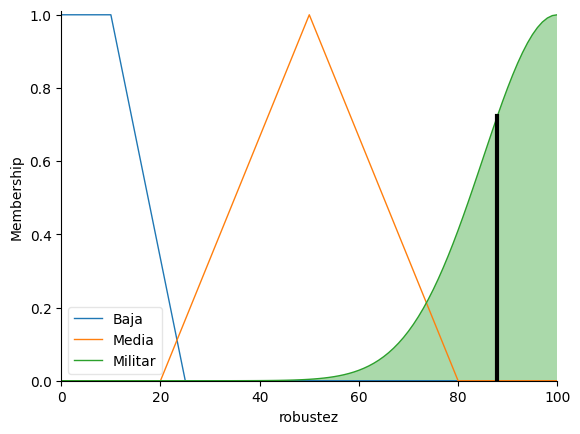

In [86]:
import numpy as np
import matplotlib.pyplot as plt
import skfuzzy as fuzz
from skfuzzy import control as ctrl  # Módulo para definir variables lingüísticas, funciones de pertenencia, reglas e inferencia difusa


# ============================================================
# REQUERIMIENTO: Definir el universo del discurso para cada variable difusa.
# - Recursos: porcentaje entre 0 y 100.
# - Sensibilidad: escala entre 0 y 10.
# - Robustez: porcentaje entre 0 y 100.
# ============================================================

Porcentaje_recursos = np.arange(0, 101, 1)
Porcetanje_sensibilidad = np.arange(0, 11, 1) #No es porcentaje, es una representacion de una escala en 0 y 10
Porentaje_robustez = np.arange(0, 101, 1)


# ============================================================
# REQUERIMIENTO: Definir al menos 3 variables difusas del dominio.
# En este sistema se definen:
# - recursos: variable de entrada / antecedente.
# - sensibilidad: variable de entrada / antecedente.
# - robustez: variable de salida / consecuente.
# ============================================================

recursos = ctrl.Antecedent(Porcentaje_recursos, 'recursos')
sensibilidad = ctrl.Antecedent(Porcetanje_sensibilidad, 'sensibilidad')
robustez = ctrl.Consequent(Porentaje_robustez, 'robustez')


# ============================================================
# REQUERIMIENTO: Implementar un proceso de defuzzificación justificado.
#
# Se selecciona el método del centroide porque la salida del sistema
# representa un porcentaje continuo de robustez entre 0 y 100.
#
# Este método permite obtener un valor numérico único considerando
# toda el área del conjunto difuso de salida generado por las reglas
# activadas, no solamente la categoría con mayor pertenencia.
#
# Por esto resulta adecuado para el proyecto, ya que la robustez
# requerida puede variar gradualmente entre niveles bajos, medios
# y militares.
# ============================================================

robustez.defuzzify_method = 'centroid'


# ============================================================
# REQUERIMIENTO: Para la variable difusa "recursos", definir mínimo
# 3 valores difusos y asociarles funciones de pertenencia.
#
# También se cumple el requisito de incluir distintos tipos de funciones:
# - Bajo: función trapezoidal.
# - Medio: función triangular.
# - Alto: función Gaussiana.
# ============================================================

Bajo = fuzz.trapmf(recursos.universe, [0, 0, 25, 50])
Medio = fuzz.trimf(recursos.universe, [25, 50, 75])
Alto = fuzz.gaussmf(recursos.universe, 100, 25)


# ============================================================
# REQUERIMIENTO: Para la variable difusa "sensibilidad", definir mínimo
# 3 valores difusos y asociarles funciones de pertenencia.
#
# También se vuelve a evidenciar el uso de:
# - Pública: función trapezoidal.
# - Confidencial: función triangular.
# - Secreta: función Gaussiana.
# ============================================================

Publica = fuzz.trapmf(sensibilidad.universe, [0, 0, 2, 4])
Confidencial = fuzz.trimf(sensibilidad.universe, [2, 4, 6])
Secreta = fuzz.gaussmf(sensibilidad.universe, 8, 2.5)


# ============================================================
# REQUERIMIENTO: Para la variable difusa de salida "robustez",
# definir mínimo 3 valores difusos y asociarles funciones de pertenencia.
#
# Se definen:
# - Baja: función trapezoidal.
# - Media: función triangular.
# - Militar: función Gaussiana.
# ============================================================

Baja = fuzz.trapmf(Porentaje_robustez, [0, 0, 10, 25])
Media = fuzz.trimf(Porentaje_robustez, [20, 50, 80])
Militar = fuzz.gaussmf(Porentaje_robustez, 100, 15)


# ============================================================
# REQUERIMIENTO: Hacer uso de dos casos de modificadores difusos.
#
# Modificador 1:
# - "Muy secreta" se obtiene elevando al cuadrado la pertenencia de "Secreta".
# - Fórmula aplicada: μ_muy A(x) = [μ_A(x)]²
#
# Modificador 2:
# - "Ligeramente bajo" se obtiene aplicando raíz cuadrada a la pertenencia de "Bajo".
# - Fórmula aplicada: μ_ligeramente A(x) = sqrt(μ_A(x))
# ============================================================

MUy_secreta = np.power(Secreta, 2)
Ligeramente_bajo = np.sqrt(Bajo)


# ============================================================
# Registrar los valores lingüísticos y sus funciones de
# pertenencia dentro de cada variable difusa del sistema de control.
#
# Esto permite que las etiquetas puedan ser usadas posteriormente
# en las reglas difusas.
# ============================================================

recursos['Bajo'] = Bajo
recursos['Medio'] = Medio
recursos['Alto'] = Alto
recursos['Ligeramente_bajo'] = Ligeramente_bajo

sensibilidad['Publica'] = Publica
sensibilidad['Confidencial'] = Confidencial
sensibilidad['Secreta'] = Secreta
sensibilidad['Muy_secreta'] = MUy_secreta

robustez['Baja'] = Baja
robustez['Media'] = Media
robustez['Militar'] = Militar


# ============================================================
# REQUERIMIENTO: Definir al menos 9 reglas difusas.
#
# Además, las reglas deben incluir los operadores:
# - Intersección / AND: operador &
# - Complemento / NOT: operador ~
# - Unión / OR: operador |
#
# Las reglas 1 a 7 usan principalmente AND.
# La regla 6 incluye complemento o negación.
# La regla 9 incluye unión u OR.
# ============================================================

# Regla con operador AND:
# Si los recursos son altos Y la sensibilidad es pública,
# entonces la robustez requerida es baja.
Regla1 = ctrl.Rule(recursos['Alto'] & sensibilidad['Publica'], robustez['Baja'])

# Regla con operador AND:
# Si los recursos son medios Y la sensibilidad es pública,
# entonces la robustez requerida es media.
Regla2 = ctrl.Rule(recursos['Medio'] & sensibilidad['Publica'], robustez['Media'])

# Regla con operador AND:
# Si los recursos son bajos Y la sensibilidad es pública,
# entonces la robustez requerida es media.
Regla3 = ctrl.Rule(recursos['Bajo'] & sensibilidad['Publica'], robustez['Media'])

# Regla con operador AND:
# Si los recursos son medios Y la sensibilidad es confidencial,
# entonces la robustez requerida es media.
Regla4 = ctrl.Rule(recursos['Medio'] & sensibilidad['Confidencial'], robustez['Media'])

# Regla con operador AND:
# Si los recursos son bajos Y la sensibilidad es confidencial,
# entonces la robustez requerida es militar.
Regla5 = ctrl.Rule(recursos['Bajo'] & sensibilidad['Confidencial'], robustez['Militar'])

# Regla con operador AND y complemento / negación:
# Si la sensibilidad es secreta Y los recursos NO son altos,
# entonces la robustez requerida es militar.
Regla6 = ctrl.Rule(sensibilidad['Secreta'] & ~recursos['Alto'], robustez['Militar'])

# Regla con operador AND:
# Si los recursos son altos Y la sensibilidad es secreta,
# entonces la robustez requerida es media.
Regla7 = ctrl.Rule(recursos['Alto'] & sensibilidad['Secreta'], robustez['Media'])

# Regla basada en modificador difuso:
# Si la sensibilidad es muy secreta,
# entonces la robustez requerida es militar.
Regla8 = ctrl.Rule(sensibilidad['Muy_secreta'], robustez['Militar'])

# Regla con operador OR y uso de modificadores difusos:
# Si los recursos son ligeramente bajos O la sensibilidad es muy secreta,
# entonces la robustez requerida es militar.
Regla9 = ctrl.Rule(recursos['Ligeramente_bajo'] | sensibilidad['Muy_secreta'], robustez['Militar'])


# ============================================================
# Construir el sistema de inferencia difusa usando
# las 9 reglas definidas anteriormente.
# ============================================================

sistema_control = ctrl.ControlSystem([
    Regla1,
    Regla2,
    Regla3,
    Regla4,
    Regla5,
    Regla6,
    Regla7,
    Regla8,
    Regla9
])


# ============================================================
# Crear una simulación del sistema de control difuso
# para poder ingresar valores concretos y realizar la inferencia.
# ============================================================

simulacion = ctrl.ControlSystemSimulation(sistema_control)


# ============================================================
# Asignar valores de entrada al sistema difuso.
#
# Caso de prueba:
# - recursos = 10
# - sensibilidad = 9
#
# Estos valores permiten evaluar el comportamiento del sistema
# y evidenciar la activación de reglas difusas.
# ============================================================

simulacion.input['recursos'] = 10
simulacion.input['sensibilidad'] = 9


# ============================================================
# Ejecutar el proceso de inferencia difusa.
#
# En esta etapa Scikit-Fuzzy evalúa las reglas activadas,
# agrega las salidas difusas y aplica posteriormente la defuzzificación.
# ============================================================

simulacion.compute()


# ============================================================
# Obtener y mostrar el resultado defuzzificado.
#
# Como se configuró previamente el método "centroid",
# el resultado corresponde al centroide del conjunto difuso de salida.
# ============================================================

resultado_robustez = simulacion.output['robustez']
print(f"La robustez requerida es del: {resultado_robustez:.2f}%")


# ============================================================
# Clasificar el resultado numérico
# obtenido después de la defuzzificación en una etiqueta lingüística.
#
# Esta parte no es obligatoria en el enunciado, pero ayuda a interpretar
# el porcentaje final de robustez.
# ============================================================

def clasificar_robustez(valor):

    if valor < 30:
        return "Baja"
    elif valor < 70:
        return "Media"
    else:
        return "Militar"


# ============================================================
# Mostrar la clasificación lingüística
# del resultado obtenido.
# ============================================================

nivel_robustez = clasificar_robustez(resultado_robustez)

print("Nivel de robustez clasificado:", nivel_robustez)


# ============================================================
# Visualizar gráficamente la salida
# del sistema difuso después de la simulación.
#
# Esto permite evidenciar el conjunto difuso de salida y el valor
# defuzzificado obtenido mediante el método del centroide.
# ============================================================

robustez.view(sim=simulacion)

#### Gráficas de funciones de pertenencia

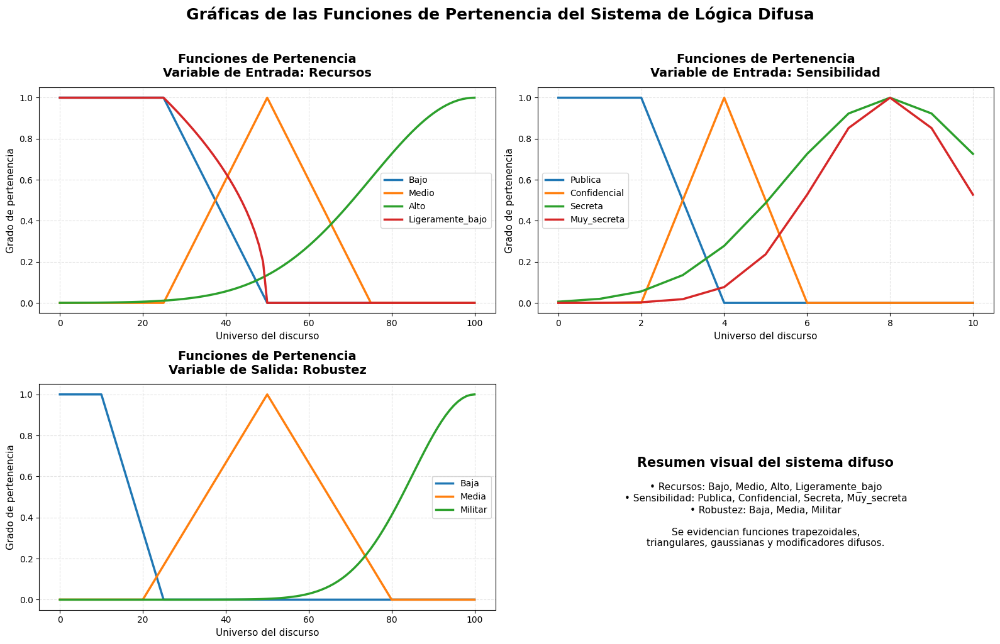

In [87]:
# ============================================================
# Gráficas de funciones de pertenencia utilizadas
# en el componente de lógica difusa.
# ============================================================

import matplotlib.pyplot as plt

# Lista de variables difusas a graficar
variables_difusas = [
    (recursos, "Funciones de Pertenencia\nVariable de Entrada: Recursos"),
    (sensibilidad, "Funciones de Pertenencia\nVariable de Entrada: Sensibilidad"),
    (robustez, "Funciones de Pertenencia\nVariable de Salida: Robustez")
]

# Crear grid de subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 10))
axes = axes.flatten()

# Graficar cada variable difusa en un subplot
for i, (variable, titulo) in enumerate(variables_difusas):
    ax = axes[i]
    
    for etiqueta in variable.terms:
        ax.plot(
            variable.universe,
            variable[etiqueta].mf,
            linewidth=2.5,
            label=etiqueta
        )
    
    ax.set_title(titulo, fontsize=14, fontweight='bold', pad=12)
    ax.set_xlabel("Universo del discurso", fontsize=11)
    ax.set_ylabel("Grado de pertenencia", fontsize=11)
    ax.set_ylim(-0.05, 1.05)
    ax.grid(True, linestyle='--', alpha=0.35)
    ax.legend(loc='best', fontsize=10, frameon=True)

# Último espacio del grid: texto explicativo
axes[3].axis('off')
axes[3].text(
    0.5, 0.65,
    "Resumen visual del sistema difuso",
    ha='center', va='center',
    fontsize=15, fontweight='bold'
)
axes[3].text(
    0.5, 0.42,
    "• Recursos: Bajo, Medio, Alto, Ligeramente_bajo\n"
    "• Sensibilidad: Publica, Confidencial, Secreta, Muy_secreta\n"
    "• Robustez: Baja, Media, Militar\n\n"
    "Se evidencian funciones trapezoidales,\n"
    "triangulares, gaussianas y modificadores difusos.",
    ha='center', va='center',
    fontsize=11
)

# Título general de toda la figura
fig.suptitle(
    "Gráficas de las Funciones de Pertenencia del Sistema de Lógica Difusa",
    fontsize=18,
    fontweight='bold',
    y=1.02
)

plt.tight_layout()
plt.show()

### ***Sistema Experto***

In [88]:
!pip install experta


[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


#### Parche obligatorio .abc

In [89]:
# ============================================================
# SISTEMA EXPERTO - PARCHE DE COMPATIBILIDAD
# ============================================================

# Requerimiento práctico:
# - Mantener esta celda porque Experta puede fallar en versiones recientes
#   de Python por cambios en collections.abc.

import collections
import collections.abc

collections.Mapping = collections.abc.Mapping
collections.MutableMapping = collections.abc.MutableMapping
collections.Sequence = collections.abc.Sequence

#### Clases de hechos

In [90]:
# ============================================================
# SISTEMA EXPERTO - CLASES DE HECHOS
# ============================================================

from experta import *
from rdflib import RDF, RDFS, Literal


# ============================================================
# Exigencia:
# - Definir clases de hechos.
# - Representar hechos de ontología.
# - Representar hechos de lógica difusa.
# - Representar decisiones inferidas.
# ============================================================

class TripleRDF(Fact):
    pass


class TripleInferido(Fact):
    pass


class ClaseOntologica(Fact):
    pass


class PropiedadOntologica(Fact):
    pass


class IndividuoOntologico(Fact):
    pass


class Algoritmo(Fact):
    pass


class EstadoSeguridad(Fact):
    pass


class ContextoUso(Fact):
    pass


class NivelRobustez(Fact):
    pass


class EvidenciaOntologica(Fact):
    pass


class DecisionFinal(Fact):
    pass

#### Utilidades RDF y semánticas del dominio

In [91]:
# ============================================================
# UTILIDADES RDF Y SEMÁNTICAS DEL DOMINIO
# ============================================================

# ============================================================
# Exigencia:
# - Convertir URIs y literales RDF en valores utilizables por Experta.
# - Consultar propiedades del grafo razonado por nombre local.
# - Clasificar recursos del dominio para activar reglas.
# ============================================================

from rdflib import Literal


def limpiar_recurso(valor):
    if valor is None:
        return None

    valor = str(valor)

    if "#" in valor:
        return valor.split("#")[-1]

    if "/" in valor:
        return valor.rstrip("/").split("/")[-1]

    return valor


def limpiar_valor(valor):
    if valor is None:
        return None

    if isinstance(valor, Literal):
        return str(valor)

    return limpiar_recurso(valor)


def valor_entero(valor, defecto=0):
    try:
        return int(str(valor))
    except:
        return defecto


def nombre_predicado(predicado):
    return limpiar_recurso(predicado)


def obtener_objeto_por_predicado(grafo, sujeto, nombres_predicado):
    nombres = set(nombres_predicado)

    for predicado, objeto in grafo.predicate_objects(sujeto):
        if nombre_predicado(predicado) in nombres:
            return objeto

    return None


def tiene_tipo_algoritmo(clases):
    claves = [
        "Algoritmo",
        "Criptografico",
        "Criptográfico",
        "Cifrado",
        "Simetrico",
        "Simétrico",
        "Asimetrico",
        "Asimétrico",
        "Hash",
        "PostCuantico",
        "PostCuántico"
    ]

    for clase in clases:
        for clave in claves:
            if clase is not None and clave in clase:
                return True

    return False


def escoger_clase_principal(clases):
    prioridad = [
        "CifradoSimetrico",
        "CifradoSimétrico",
        "CifradoAsimetrico",
        "CifradoAsimétrico",
        "HashCriptografico",
        "HashCriptográfico",
        "AlgoritmoPostCuantico",
        "AlgoritmoPostCuántico",
        "AlgoritmoCriptografico",
        "AlgoritmoCriptográfico",
        "Algoritmo"
    ]

    for clase_prioritaria in prioridad:
        for clase in clases:
            if clase == clase_prioritaria:
                return clase

    for clase in clases:
        if clase not in ["Resource", "Class", "Property"]:
            return clase

    return "NoEspecificado"


def normalizar_robustez(valor):
    if valor is None:
        return "NoCalculado"

    valor = str(valor)

    equivalencias = {
        "Muy Alta": "MuyAlta",
        "Muy alta": "MuyAlta",
        "muy alta": "MuyAlta",
        "PostCuántica": "PostCuantica",
        "postcuántica": "PostCuantica",
        "PostCuantica": "PostCuantica",
        "Militar": "Militar",
        "Alta": "Alta",
        "Media": "Media",
        "Baja": "Baja"
    }

    return equivalencias.get(valor, valor)


def texto_normalizado(valor):
    if valor is None:
        return ""

    valor = str(valor)
    valor = valor.replace("_", "").replace("-", "").replace(" ", "")
    valor = valor.lower()

    reemplazos = {
        "á": "a",
        "é": "e",
        "í": "i",
        "ó": "o",
        "ú": "u",
        "ñ": "n"
    }

    for a, b in reemplazos.items():
        valor = valor.replace(a, b)

    return valor


def juntar_info(nombre=None, clase=None, clases=None, nivel=None, contexto=None):
    partes = []

    for valor in [nombre, clase, nivel, contexto]:
        if valor is not None:
            partes.append(str(valor))

    if clases is not None:
        for c in clases:
            partes.append(str(c))

    return texto_normalizado(" ".join(partes))


def es_hash(nombre=None, clase=None, clases=None):
    info = juntar_info(nombre=nombre, clase=clase, clases=clases)

    hashes = [
        "sha1",
        "sha256",
        "sha3",
        "sha3256",
        "md5",
        "hash",
        "resumen"
    ]

    return any(h in info for h in hashes)


def es_hash_roto(nombre=None, nivel=None):
    info = juntar_info(nombre=nombre, nivel=nivel)

    rotos = [
        "md5",
        "sha1",
        "roto",
        "obsoleto",
        "bajaseguridad",
        "inseguro"
    ]

    return any(r in info for r in rotos)


def es_inseguro(nombre=None, nivel=None):
    info = juntar_info(nombre=nombre, nivel=nivel)

    inseguros = [
        "des",
        "tdes",
        "tripledes",
        "rc4",
        "md5",
        "sha1",
        "rsa1024",
        "obsoleto",
        "roto",
        "bajaseguridad",
        "inseguro"
    ]

    seguros_excepcion = [
        "aes",
        "sha256",
        "sha3"
    ]

    if any(ex in info for ex in seguros_excepcion):
        if not any(x in info for x in ["obsoleto", "roto", "bajaseguridad", "inseguro"]):
            return False

    return any(i in info for i in inseguros)


def es_postcuantico(nombre=None, clase=None, clases=None, nivel=None):
    info = juntar_info(nombre=nombre, clase=clase, clases=clases, nivel=nivel)

    post = [
        "kyber",
        "dilithium",
        "falcon",
        "sphincs",
        "postcuantico",
        "postcuantica"
    ]

    return any(p in info for p in post)


def es_seguridad_alta(nombre=None, nivel=None):
    info = juntar_info(nombre=nombre, nivel=nivel)

    alta = [
        "aes256",
        "rsa2048",
        "rsa4096",
        "ecc256",
        "chacha20",
        "altaseguridad",
        "seguridadalta",
        "postcuanticoseguro"
    ]

    return any(a in info for a in alta)


def es_contexto_critico(contexto=None):
    info = juntar_info(contexto=contexto)

    criticos = [
        "infraestructuracritica",
        "gobierno",
        "militar",
        "empresarial",
        "firmadigital"
    ]

    return any(c in info for c in criticos)


def es_bajo_computo_real(nombre=None, clase=None, clases=None, memoria=None, contexto=None):
    info = juntar_info(nombre=nombre, clase=clase, clases=clases, contexto=contexto)
    mem = texto_normalizado(memoria)

    if "aes" in info:
        return False

    candidatos = [
        "iot",
        "embebido",
        "sensores",
        "dispositivomovil",
        "ligero"
    ]

    algoritmos_livianos = [
        "chacha20",
        "ecc256"
    ]

    return (
        any(c in info for c in candidatos) or
        any(a in info for a in algoritmos_livianos) or
        mem in ["baja", "muybaja", "ligera"]
    )


def usa_clave_criptografica(nombre=None, clase=None, clases=None):
    if es_hash(nombre=nombre, clase=clase, clases=clases):
        return False

    if es_postcuantico(nombre=nombre, clase=clase, clases=clases):
        return False

    return True


print("Utilidades RDF y semánticas cargadas correctamente.")

Utilidades RDF y semánticas cargadas correctamente.


#### Grafo razonado como fuente del sistema experto

In [92]:
# ============================================================
# GRAFO RAZONADO
# ============================================================

# ============================================================
# Exigencia:
# - Usar el grafo resultante después del razonamiento semántico.
# - Conservar los nuevos hechos inferidos si ya fueron calculados.
# ============================================================

grafo_razonado = g

try:
    hechos_inferidos = nuevos_hechos
except NameError:
    try:
        hechos_inferidos = grafo_razonado - grafo_original
    except NameError:
        hechos_inferidos = set()

print("Grafo usado por Experta:", "grafo_razonado")
print("Tripletas en grafo razonado:", len(grafo_razonado))
print("Tripletas inferidas disponibles:", len(hechos_inferidos))

Grafo usado por Experta: grafo_razonado
Tripletas en grafo razonado: 855
Tripletas inferidas disponibles: 446


#### Traductores hacia Experta

In [93]:
# ============================================================
# TRADUCTORES RDF, ONTOLOGÍA, DOMINIO Y FUZZY HACIA EXPERTA
# ============================================================

# ============================================================
# Exigencia:
# - Traducir tripletas del grafo razonado como hechos iniciales.
# - Traducir nuevos hechos inferidos como hechos del motor.
# - Traducir clases, propiedades e individuos.
# - Crear hechos específicos del dominio.
# - Usar el resultado fuzzy como hecho del sistema experto.
# ============================================================

def declarar_triples_rdf(engine, grafo):
    cantidad = 0

    for sujeto, predicado, objeto in grafo:
        engine.declare(
            TripleRDF(
                sujeto=limpiar_recurso(sujeto),
                predicado=limpiar_recurso(predicado),
                objeto=limpiar_valor(objeto),
                sujeto_uri=str(sujeto),
                predicado_uri=str(predicado),
                objeto_uri=str(objeto)
            )
        )

        cantidad += 1

    print(f"Triples RDF declarados como hechos: {cantidad}")


def declarar_triples_inferidos(engine, hechos_inferidos):
    cantidad = 0

    for sujeto, predicado, objeto in hechos_inferidos:
        engine.declare(
            TripleInferido(
                sujeto=limpiar_recurso(sujeto),
                predicado=limpiar_recurso(predicado),
                objeto=limpiar_valor(objeto),
                sujeto_uri=str(sujeto),
                predicado_uri=str(predicado),
                objeto_uri=str(objeto)
            )
        )

        cantidad += 1

    print(f"Triples inferidos declarados como hechos: {cantidad}")


def declarar_estructura_ontologica(engine, grafo):
    clases = 0
    propiedades = 0
    individuos = 0

    for clase in grafo.subjects(RDF.type, RDFS.Class):
        engine.declare(
            ClaseOntologica(
                nombre=limpiar_recurso(clase),
                label=limpiar_valor(grafo.value(clase, RDFS.label))
            )
        )

        clases += 1

    for propiedad in grafo.subjects(RDF.type, RDF.Property):
        engine.declare(
            PropiedadOntologica(
                nombre=limpiar_recurso(propiedad),
                label=limpiar_valor(grafo.value(propiedad, RDFS.label)),
                dominio=limpiar_recurso(grafo.value(propiedad, RDFS.domain)),
                rango=limpiar_recurso(grafo.value(propiedad, RDFS.range))
            )
        )

        propiedades += 1

    for sujeto, clase in grafo.subject_objects(RDF.type):
        clase_limpia = limpiar_recurso(clase)

        if clase_limpia not in ["Class", "Property"]:
            engine.declare(
                IndividuoOntologico(
                    nombre=limpiar_recurso(sujeto),
                    clase=clase_limpia
                )
            )

            individuos += 1

    print(f"Clases declaradas: {clases}")
    print(f"Propiedades declaradas: {propiedades}")
    print(f"Individuos declarados: {individuos}")


def declarar_algoritmos_desde_ontologia(engine, grafo):
    algoritmos_declarados = 0
    sujetos_algoritmo = set()

    for sujeto in set(grafo.subjects(RDF.type, None)):
        clases = [
            limpiar_recurso(clase)
            for clase in grafo.objects(sujeto, RDF.type)
        ]

        if tiene_tipo_algoritmo(clases):
            sujetos_algoritmo.add(sujeto)

    for sujeto in sorted(sujetos_algoritmo, key=lambda x: limpiar_recurso(x)):
        nombre = limpiar_recurso(sujeto)

        clases = [
            limpiar_recurso(clase)
            for clase in grafo.objects(sujeto, RDF.type)
        ]

        clase_principal = escoger_clase_principal(clases)

        nivel_seguridad = limpiar_valor(
            obtener_objeto_por_predicado(
                grafo,
                sujeto,
                ["tieneNivelSeguridad", "nivelSeguridad", "esSeguro"]
            )
        )

        contexto_uso = limpiar_valor(
            obtener_objeto_por_predicado(
                grafo,
                sujeto,
                ["esRecomendadoPara", "recomendadoPara", "aplicaEn"]
            )
        )

        clave_raw = obtener_objeto_por_predicado(
            grafo,
            sujeto,
            ["utilizaClaveDeTamano", "tamanoClave", "tamañoClave"]
        )

        memoria = limpiar_valor(
            obtener_objeto_por_predicado(
                grafo,
                sujeto,
                ["requiereMemoria", "tieneRequerimientoMemoria"]
            )
        )

        velocidad = limpiar_valor(
            obtener_objeto_por_predicado(
                grafo,
                sujeto,
                ["tieneVelocidadEjecucion", "velocidadEjecucion"]
            )
        )

        estandar = limpiar_valor(
            obtener_objeto_por_predicado(
                grafo,
                sujeto,
                ["fueEstandarizadoPor", "estandarizadoPor"]
            )
        )

        limitacion = limpiar_valor(
            obtener_objeto_por_predicado(
                grafo,
                sujeto,
                ["tieneLimitacionGeneral", "limitacionGeneral", "limitaciónGeneral"]
            )
        )

        clave = valor_entero(clave_raw, defecto=0)

        engine.declare(
            Algoritmo(
                nombre=nombre,
                clase=clase_principal,
                clases=tuple(sorted(clases)),
                utilizaClaveTamano=clave,
                memoria=memoria if memoria else "NoEspecificado",
                velocidad=velocidad if velocidad else "NoEspecificado",
                estandar=estandar if estandar else "NoEspecificado",
                limitacion=limitacion if limitacion else "NoEspecificado"
            )
        )

        engine.declare(
            EstadoSeguridad(
                algoritmo=nombre,
                nivel=nivel_seguridad if nivel_seguridad else "NoEspecificado"
            )
        )

        engine.declare(
            ContextoUso(
                algoritmo=nombre,
                esRecomendadoPara=contexto_uso if contexto_uso else "NoEspecificado"
            )
        )

        algoritmos_declarados += 1

    print(f"Algoritmos declarados como hechos específicos: {algoritmos_declarados}")


def declarar_resultados_fuzzy(engine, grafo, robustez_fuzzy):
    robustez_fuzzy = normalizar_robustez(robustez_fuzzy)

    algoritmos = set()

    for sujeto in set(grafo.subjects(RDF.type, None)):
        clases = [
            limpiar_recurso(clase)
            for clase in grafo.objects(sujeto, RDF.type)
        ]

        if tiene_tipo_algoritmo(clases):
            algoritmos.add(limpiar_recurso(sujeto))

    for algoritmo in sorted(algoritmos):
        engine.declare(
            NivelRobustez(
                algoritmo=algoritmo,
                robustez=robustez_fuzzy
            )
        )

    print(f"Resultados fuzzy declarados: {len(algoritmos)}")
    print(f"Robustez fuzzy usada en Experta: {robustez_fuzzy}")


def cargar_base_hechos(engine, grafo, robustez_fuzzy, hechos_inferidos=None):
    if hechos_inferidos is None:
        hechos_inferidos = set()

    declarar_triples_rdf(engine, grafo)
    declarar_triples_inferidos(engine, hechos_inferidos)
    declarar_estructura_ontologica(engine, grafo)
    declarar_algoritmos_desde_ontologia(engine, grafo)
    declarar_resultados_fuzzy(engine, grafo, robustez_fuzzy)

    print(f"Total de hechos iniciales en Experta: {len(engine.facts)}")

#### Motor experto y reglas

In [98]:
# ============================================================
# MOTOR EXPERTO
# ============================================================

# ============================================================
# Exigencia:
# - Definir reglas basadas en conocimiento del dominio.
# - Usar mínimo 15 reglas.
# - Usar varios niveles de prioridad.
# - Usar especificidad en reglas con más condiciones.
# - Usar bloqueo lógico para evitar activaciones repetidas.
# - Usar hechos de ontología y fuzzy en precondiciones.
#
# Idea central de esta versión:
# - El fuzzy calcula la robustez requerida por el contexto.
# - La ontología aporta el nivel de seguridad del algoritmo.
# - Experta compara ambos niveles:
#       si nivel_algoritmo >= robustez_requerida -> recomendado
#       si nivel_algoritmo < robustez_requerida  -> no recomendado
# ============================================================


def valor_nivel_seguridad(nivel):
    """
    Convierte niveles lingüísticos de seguridad/robustez en una escala ordinal.
    La comparación permite verificar si un algoritmo alcanza la robustez requerida.
    """

    if nivel is None:
        return 0

    nivel_norm = texto_normalizado(normalizar_robustez(nivel))

    mapa_directo = {
        "noespecificado": 0,
        "nocalculado": 0,
        "inseguro": 0,
        "obsoleto": 0,
        "roto": 0,

        "baja": 1,
        "bajaseguridad": 1,
        "muybaja": 1,

        "media": 2,
        "seguridadmedia": 2,

        "alta": 3,
        "altaseguridad": 3,
        "seguridadalta": 3,

        "muyalta": 4,
        "militar": 4,
        "seguridadmilitar": 4,

        "postcuantica": 5,
        "postcuantico": 5,
        "postcuanticoseguro": 5
    }

    if nivel_norm in mapa_directo:
        return mapa_directo[nivel_norm]

    if "postcuant" in nivel_norm:
        return 5

    if "militar" in nivel_norm or "muyalta" in nivel_norm:
        return 4

    if "alta" in nivel_norm:
        return 3

    if "media" in nivel_norm:
        return 2

    if "baja" in nivel_norm or "obsoleto" in nivel_norm or "roto" in nivel_norm:
        return 1

    return 0


def algoritmo_cumple_robustez(nivel_algoritmo, robustez_requerida):
    return valor_nivel_seguridad(nivel_algoritmo) >= valor_nivel_seguridad(robustez_requerida)


def algoritmo_no_cumple_robustez(nivel_algoritmo, robustez_requerida):
    return valor_nivel_seguridad(nivel_algoritmo) < valor_nivel_seguridad(robustez_requerida)


class SistemaExpertoCriptografia(KnowledgeEngine):

    @Rule(
        AS.hecho << TripleRDF(predicado="subClassOf", sujeto=MATCH.subclase, objeto=MATCH.superclase),
        TEST(lambda superclase: superclase != "Resource"),
        salience=40
    )
    def r01_jerarquia_clases(self, hecho, subclase, superclase):
        self.declare(
            EvidenciaOntologica(
                tipo="JerarquiaClases",
                descripcion=f"{subclase} es subclase de {superclase}"
            )
        )

        # BLOQUEO TIPO NO-LOOP
        self.retract(hecho)

        print(f"[Ontología] {subclase} -> subClassOf -> {superclase}")


    @Rule(
        TripleRDF(predicado="subPropertyOf", sujeto=MATCH.subpropiedad, objeto=MATCH.superpropiedad),
        salience=40
    )
    def r02_jerarquia_propiedades(self, subpropiedad, superpropiedad):
        self.declare(
            EvidenciaOntologica(
                tipo="JerarquiaPropiedades",
                descripcion=f"{subpropiedad} es subpropiedad de {superpropiedad}"
            )
        )

        print(f"[Ontología] {subpropiedad} -> subPropertyOf -> {superpropiedad}")


    @Rule(
        PropiedadOntologica(nombre=MATCH.propiedad, dominio=MATCH.dominio, rango=MATCH.rango),
        TEST(lambda dominio, rango: dominio is not None and rango is not None),
        salience=38
    )
    def r03_dominio_rango(self, propiedad, dominio, rango):
        self.declare(
            EvidenciaOntologica(
                tipo="DominioRango",
                descripcion=f"{propiedad}: dominio={dominio}, rango={rango}"
            )
        )

        print(f"[Ontología] {propiedad}: dominio={dominio}, rango={rango}")


    @Rule(
        IndividuoOntologico(nombre=MATCH.nombre, clase=MATCH.clase),
        TEST(lambda clase: clase not in ["Resource", "Class", "Property"]),
        salience=37
    )
    def r04_individuos_clase(self, nombre, clase):
        self.declare(
            EvidenciaOntologica(
                tipo="IndividuoClase",
                descripcion=f"{nombre} pertenece a {clase}"
            )
        )

        print(f"[Ontología] {nombre} pertenece a {clase}")


    @Rule(
        TripleInferido(sujeto=MATCH.sujeto, predicado=MATCH.predicado, objeto=MATCH.objeto),
        TEST(lambda predicado, objeto: not (predicado == "type" and objeto == "Resource")),
        TEST(lambda sujeto: sujeto not in ["type", "subClassOf", "subPropertyOf", "domain", "range", "label"]),
        salience=36
    )
    def r05_hecho_inferido(self, sujeto, predicado, objeto):
        self.declare(
            EvidenciaOntologica(
                tipo="HechoInferido",
                descripcion=f"{sujeto} {predicado} {objeto}"
            )
        )

        print(f"[Inferido] {sujeto} {predicado} {objeto}")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nombre, nivel: es_inseguro(nombre=nombre, nivel=nivel)),
        salience=35
    )
    def r06_descartar_inseguro(self, nombre):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="NoRecomendado",
                explicacion="Algoritmo inseguro, obsoleto o con seguridad insuficiente"
            )
        )

        print(f"[Decisión] {nombre}: no recomendado por seguridad")


    @Rule(
        Algoritmo(nombre=MATCH.nombre, clase=MATCH.clase, clases=MATCH.clases),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nombre, nivel: es_hash_roto(nombre=nombre, nivel=nivel)),
        salience=34
    )
    def r07_descartar_hash_roto(self, nombre):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="NoRecomendado",
                explicacion="Hash no recomendado para seguridad moderna"
            )
        )

        print(f"[Decisión] {nombre}: no recomendado como hash seguro")


    @Rule(
        Algoritmo(nombre=MATCH.nombre, clase=MATCH.clase, clases=MATCH.clases, utilizaClaveTamano=MATCH.clave),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nombre, clase, clases: usa_clave_criptografica(nombre=nombre, clase=clase, clases=clases)),
        TEST(lambda clave: clave > 0 and clave < 128),
        salience=33
    )
    def r08_descartar_clave_pequena(self, nombre):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="NoRecomendado",
                explicacion="Tamaño de clave insuficiente para el contexto de seguridad"
            )
        )

        print(f"[Decisión] {nombre}: no recomendado por clave pequeña")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel="NoEspecificado"),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        salience=32
    )
    def r09_revision_sin_seguridad(self, nombre):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RevisionManual",
                explicacion="No se encontró nivel de seguridad explícito en la ontología"
            )
        )

        print(f"[Decisión] {nombre}: revisión manual por seguridad no especificada")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        NivelRobustez(algoritmo=MATCH.nombre, robustez="NoCalculado"),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        salience=31
    )
    def r10_revision_sin_fuzzy(self, nombre):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RevisionManual",
                explicacion="No hay robustez fuzzy asociada al contexto"
            )
        )

        print(f"[Decisión] {nombre}: revisión manual por fuzzy no calculado")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel_algoritmo),
        NivelRobustez(algoritmo=MATCH.nombre, robustez=MATCH.robustez_requerida),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nivel_algoritmo, robustez_requerida: algoritmo_no_cumple_robustez(
            nivel_algoritmo,
            robustez_requerida
        )),
        salience=30
    )
    def r11_no_alcanza_robustez_requerida(self, nombre, nivel_algoritmo, robustez_requerida):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="NoRecomendado",
                explicacion=(
                    f"El algoritmo tiene nivel {nivel_algoritmo}, "
                    f"pero el contexto requiere robustez {robustez_requerida}"
                )
            )
        )

        print(f"[Decisión] {nombre}: no alcanza la robustez requerida")


    @Rule(
        Algoritmo(nombre=MATCH.nombre, clase=MATCH.clase, clases=MATCH.clases),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel_algoritmo),
        NivelRobustez(algoritmo=MATCH.nombre, robustez=MATCH.robustez_requerida),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nombre, clase, clases: es_hash(nombre=nombre, clase=clase, clases=clases)),
        TEST(lambda nombre, nivel_algoritmo: not es_hash_roto(nombre=nombre, nivel=nivel_algoritmo)),
        TEST(lambda nivel_algoritmo, robustez_requerida: algoritmo_cumple_robustez(
            nivel_algoritmo,
            robustez_requerida
        )),
        salience=29
    )
    def r12_recomendar_hash_seguro(self, nombre, nivel_algoritmo, robustez_requerida):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RecomendadoIntegridad",
                explicacion=(
                    f"El algoritmo alcanza la robustez requerida. "
                    f"Nivel del algoritmo: {nivel_algoritmo}; "
                    f"robustez requerida por fuzzy: {robustez_requerida}. "
                    f"Adecuado para integridad o verificación criptográfica."
                )
            )
        )

        print(f"[Decisión] {nombre}: recomendado para integridad")


    @Rule(
        Algoritmo(nombre=MATCH.nombre, clase=MATCH.clase, clases=MATCH.clases),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel_algoritmo),
        NivelRobustez(algoritmo=MATCH.nombre, robustez=MATCH.robustez_requerida),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nombre, clase, clases, nivel_algoritmo: es_postcuantico(
            nombre=nombre,
            clase=clase,
            clases=clases,
            nivel=nivel_algoritmo
        )),
        TEST(lambda nivel_algoritmo, robustez_requerida: algoritmo_cumple_robustez(
            nivel_algoritmo,
            robustez_requerida
        )),
        salience=28
    )
    def r13_recomendar_postcuantico(self, nombre, nivel_algoritmo, robustez_requerida):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RecomendadoPostCuantico",
                explicacion=(
                    f"El algoritmo alcanza o supera la robustez requerida. "
                    f"Nivel del algoritmo: {nivel_algoritmo}; "
                    f"robustez requerida por fuzzy: {robustez_requerida}. "
                    f"Adecuado para escenarios con amenaza cuántica."
                )
            )
        )

        print(f"[Decisión] {nombre}: recomendado por seguridad postcuántica")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel_algoritmo),
        ContextoUso(algoritmo=MATCH.nombre, esRecomendadoPara=MATCH.contexto),
        NivelRobustez(algoritmo=MATCH.nombre, robustez=MATCH.robustez_requerida),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda contexto: es_contexto_critico(contexto)),
        TEST(lambda nivel_algoritmo, robustez_requerida: algoritmo_cumple_robustez(
            nivel_algoritmo,
            robustez_requerida
        )),
        salience=27
    )
    def r14_recomendar_contexto_critico(self, nombre, nivel_algoritmo, robustez_requerida, contexto):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RecomendadoAltaSeguridad",
                explicacion=(
                    f"El algoritmo cumple el nivel requerido para un contexto crítico. "
                    f"Contexto: {contexto}; "
                    f"nivel del algoritmo: {nivel_algoritmo}; "
                    f"robustez requerida por fuzzy: {robustez_requerida}."
                )
            )
        )

        print(f"[Decisión] {nombre}: recomendado para contexto crítico")


    @Rule(
        Algoritmo(nombre=MATCH.nombre, clase=MATCH.clase, clases=MATCH.clases, memoria=MATCH.memoria),
        ContextoUso(algoritmo=MATCH.nombre, esRecomendadoPara=MATCH.contexto),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel_algoritmo),
        NivelRobustez(algoritmo=MATCH.nombre, robustez=MATCH.robustez_requerida),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nombre, clase, clases, memoria, contexto: es_bajo_computo_real(
            nombre=nombre,
            clase=clase,
            clases=clases,
            memoria=memoria,
            contexto=contexto
        )),
        TEST(lambda nombre, nivel_algoritmo: not es_inseguro(nombre=nombre, nivel=nivel_algoritmo)),
        TEST(lambda nivel_algoritmo, robustez_requerida: algoritmo_cumple_robustez(
            nivel_algoritmo,
            robustez_requerida
        )),
        salience=26
    )
    def r15_recomendar_bajo_computo(self, nombre, nivel_algoritmo, robustez_requerida):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RecomendadoBajoComputo",
                explicacion=(
                    f"El algoritmo es adecuado para bajo cómputo y alcanza la robustez requerida. "
                    f"Nivel del algoritmo: {nivel_algoritmo}; "
                    f"robustez requerida por fuzzy: {robustez_requerida}."
                )
            )
        )

        print(f"[Decisión] {nombre}: recomendado para bajo cómputo")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel_algoritmo),
        NivelRobustez(algoritmo=MATCH.nombre, robustez=MATCH.robustez_requerida),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nombre, nivel_algoritmo: not es_inseguro(nombre=nombre, nivel=nivel_algoritmo)),
        TEST(lambda nivel_algoritmo, robustez_requerida: algoritmo_cumple_robustez(
            nivel_algoritmo,
            robustez_requerida
        )),
        salience=25
    )
    def r16_recomendar_por_comparacion_general(self, nombre, nivel_algoritmo, robustez_requerida):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RecomendadoUsoGeneral",
                explicacion=(
                    f"El algoritmo alcanza o supera la robustez requerida por el contexto. "
                    f"Nivel del algoritmo: {nivel_algoritmo}; "
                    f"robustez requerida por fuzzy: {robustez_requerida}."
                )
            )
        )

        print(f"[Decisión] {nombre}: recomendado por comparación de robustez")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        EstadoSeguridad(algoritmo=MATCH.nombre, nivel=MATCH.nivel_algoritmo),
        NivelRobustez(algoritmo=MATCH.nombre, robustez=MATCH.robustez_requerida),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        TEST(lambda nivel_algoritmo, robustez_requerida: valor_nivel_seguridad(nivel_algoritmo) == 0 or valor_nivel_seguridad(robustez_requerida) == 0),
        salience=24
    )
    def r17_revision_por_niveles_no_comparables(self, nombre, nivel_algoritmo, robustez_requerida):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RevisionManual",
                explicacion=(
                    f"No fue posible comparar de forma confiable el nivel del algoritmo "
                    f"({nivel_algoritmo}) con la robustez requerida ({robustez_requerida})."
                )
            )
        )

        print(f"[Decisión] {nombre}: revisión manual por niveles no comparables")


    @Rule(
        Algoritmo(nombre=MATCH.nombre),
        NOT(DecisionFinal(algoritmo=MATCH.nombre)),
        salience=-1
    )
    def r18_decision_respaldo(self, nombre):
        self.declare(
            DecisionFinal(
                algoritmo=nombre,
                decision="RevisionManual",
                explicacion="No se activó una regla específica suficiente para tomar una decisión"
            )
        )

        print(f"[Decisión] {nombre}: revisión manual")

#### Ejecución y evidencias finales

In [99]:
# ============================================================
# CELDA 7 - CARGA DE HECHOS Y BASE ANTES DE LA INFERENCIA
# ============================================================

# ============================================================
# Exigencia:
# - Cargar el resultado fuzzy en el sistema experto.
# - Cargar el grafo razonado como base de hechos.
# - Mostrar el estado de engine.facts antes de ejecutar inferencia.
# ============================================================


def formatear_hecho(hecho):
    """
    Convierte un hecho de Experta en texto legible.
    Evita que se imprima únicamente como <f-1>, <f-2>, etc.
    """

    tipo = type(hecho).__name__

    try:
        contenido = dict(hecho)
    except:
        contenido = str(hecho)

    return f"{tipo}: {contenido}"


engine = SistemaExpertoCriptografia()
engine.reset()

robustez_fuzzy = nivel_robustez

# ============================================================
# CARGA DE HECHOS INICIALES
# ============================================================

print("======================================")
print("CARGA DE HECHOS INICIALES")
print("======================================")

cargar_base_hechos(
    engine=engine,
    grafo=grafo_razonado,
    robustez_fuzzy=robustez_fuzzy,
    hechos_inferidos=hechos_inferidos
)


# ============================================================
# GUARDAR BASE ANTES DE LA INFERENCIA
# ============================================================

hechos_antes_inferencia = dict(engine.facts)
ids_antes_inferencia = set(hechos_antes_inferencia.keys())

cantidad_antes = len(hechos_antes_inferencia)


# ============================================================
# RESUMEN DE HECHOS ANTES DE INFERIR
# ============================================================

print("======================================")
print("RESUMEN DE LA BASE ANTES DE LA INFERENCIA")
print("======================================")

print(f"Total de hechos antes de engine.run(): {cantidad_antes}")

conteo_antes = {}

for _, hecho in hechos_antes_inferencia.items():
    tipo = type(hecho).__name__
    conteo_antes[tipo] = conteo_antes.get(tipo, 0) + 1

print("\nCantidad de hechos por tipo:\n")

for tipo, cantidad in sorted(conteo_antes.items()):
    print(f"{tipo}: {cantidad}")


# ============================================================
# MOSTRAR TODOS LOS HECHOS ANTES DE INFERIR (Quitar comentario para visualizar los hechos como texto)
# ============================================================
'''
print("======================================")
print("BASE DE HECHOS ANTES DE LA INFERENCIA")
print("======================================")

for id_hecho, hecho in hechos_antes_inferencia.items():
    print(f"Hecho {id_hecho} | INGRESADO")
    print(formatear_hecho(hecho))
    print("-" * 80)
'''

CARGA DE HECHOS INICIALES
Triples RDF declarados como hechos: 855
Triples inferidos declarados como hechos: 446
Clases declaradas: 10
Propiedades declaradas: 28
Individuos declarados: 414
Algoritmos declarados como hechos específicos: 18
Resultados fuzzy declarados: 18
Robustez fuzzy usada en Experta: Militar
Total de hechos iniciales en Experta: 1819
RESUMEN DE LA BASE ANTES DE LA INFERENCIA
Total de hechos antes de engine.run(): 1819

Cantidad de hechos por tipo:

Algoritmo: 18
ClaseOntologica: 10
ContextoUso: 18
EstadoSeguridad: 18
IndividuoOntologico: 407
InitialFact: 1
NivelRobustez: 18
PropiedadOntologica: 28
TripleInferido: 446
TripleRDF: 855


'\nprint("======================================")\nprint("BASE DE HECHOS ANTES DE LA INFERENCIA")\nprint("======================================")\n\nfor id_hecho, hecho in hechos_antes_inferencia.items():\n    print(f"Hecho {id_hecho} | INGRESADO")\n    print(formatear_hecho(hecho))\n    print("-" * 80)\n'

In [104]:
print("======================================")
print(f"Resultado fuzzy recibido por Experta: {robustez_fuzzy}")
print("======================================\n")




Resultado fuzzy recibido por Experta: Militar



In [105]:
# ============================================================
# CELDA 8 - BASE DE HECHOS DESPUÉS DE LA INFERENCIA
# ============================================================

# ============================================================
# Exigencia:
# - Ejecutar engine.run().
# - Mostrar el estado de la base de hechos después de inferir.
# - Indicar cuáles hechos ya existían y cuáles fueron inferidos.
# ============================================================


print("======================================")
print("EJECUCIÓN DE INFERENCIA CON engine.run()")
print("======================================")

engine.run()


# ============================================================
# GUARDAR BASE DESPUÉS DE LA INFERENCIA
# ============================================================

hechos_despues_inferencia = dict(engine.facts)
ids_despues_inferencia = set(hechos_despues_inferencia.keys())

cantidad_despues = len(hechos_despues_inferencia)

ids_nuevos = ids_despues_inferencia - ids_antes_inferencia


# ============================================================
# RESUMEN DESPUÉS DE INFERIR
# ============================================================

print("\n======================================")
print("RESUMEN DE LA BASE DESPUÉS DE LA INFERENCIA")
print("======================================\n")

print(f"Hechos antes de engine.run(): {len(hechos_antes_inferencia)}")
print(f"Hechos después de engine.run(): {cantidad_despues}")
print(f"Nuevos hechos inferidos por Experta: {len(ids_nuevos)}")

conteo_despues = {}

for _, hecho in hechos_despues_inferencia.items():
    tipo = type(hecho).__name__
    conteo_despues[tipo] = conteo_despues.get(tipo, 0) + 1

print("\nCantidad de hechos por tipo después de inferir:\n")

for tipo, cantidad in sorted(conteo_despues.items()):
    print(f"{tipo}: {cantidad}")


# ============================================================
# MOSTRAR TODOS LOS HECHOS DESPUÉS DE INFERIR (Quitar comment para visualizar la base de hechos después de la inferencia calsificada por hecho nuevo o inferido)
# ============================================================
'''
print("\n======================================")
print("BASE DE HECHOS DESPUÉS DE LA INFERENCIA")
print("======================================\n")

for id_hecho, hecho in hechos_despues_inferencia.items():

    if id_hecho in ids_nuevos:
        estado = "INFERIDO"
    else:
        estado = "YA EXISTÍA"

    print(f"Hecho {id_hecho} | {estado}")
    print(formatear_hecho(hecho))
    print("-" * 80)

'''

EJECUCIÓN DE INFERENCIA CON engine.run()

RESUMEN DE LA BASE DESPUÉS DE LA INFERENCIA

Hechos antes de engine.run(): 1819
Hechos después de engine.run(): 2241
Nuevos hechos inferidos por Experta: 439

Cantidad de hechos por tipo después de inferir:

Algoritmo: 18
ClaseOntologica: 10
ContextoUso: 18
DecisionFinal: 18
EstadoSeguridad: 18
EvidenciaOntologica: 421
IndividuoOntologico: 407
InitialFact: 1
NivelRobustez: 18
PropiedadOntologica: 28
TripleInferido: 446
TripleRDF: 838


'\nprint("\n======================================")\nprint("BASE DE HECHOS DESPUÉS DE LA INFERENCIA")\nprint("======================================\n")\n\nfor id_hecho, hecho in hechos_despues_inferencia.items():\n\n    if id_hecho in ids_nuevos:\n        estado = "INFERIDO"\n    else:\n        estado = "YA EXISTÍA"\n\n    print(f"Hecho {id_hecho} | {estado}")\n    print(formatear_hecho(hecho))\n    print("-" * 80)\n\n'

#### ESTADOS DE SEGURIDAD TRADUCIDOS

In [106]:
# ============================================================
# ESTADOS DE SEGURIDAD TRADUCIDOS
# ============================================================

print("\n==============================")
print("ESTADOS DE SEGURIDAD TRADUCIDOS")
print("==============================\n")

estados = []

for _, hecho in engine.facts.items():
    if isinstance(hecho, EstadoSeguridad):
        estados.append(hecho)

for hecho in sorted(estados, key=lambda h: h["algoritmo"]):
    print(f"{hecho['algoritmo']} -> {hecho['nivel']}")


ESTADOS DE SEGURIDAD TRADUCIDOS

AES_256 -> AltaSeguridad
ChaCha20 -> AltaSeguridad
DES -> Vulnerable
DiffieHellman -> AltaSeguridad
Dilithium -> PostCuanticoSeguro
ECC_256 -> AltaSeguridad
Falcon -> PostCuanticoSeguro
Kyber -> PostCuanticoSeguro
MD5 -> Vulnerable
RC4 -> Vulnerable
RSA_1024 -> Vulnerable
RSA_2048 -> AltaSeguridad
RSA_4096 -> AltaSeguridad
SHA_1 -> Vulnerable
SHA_256 -> AltaSeguridad
SHA_3 -> AltaSeguridad
SphincsPlus -> PostCuanticoSeguro
TDES -> Obsoleto


## **Módulo de Uso**

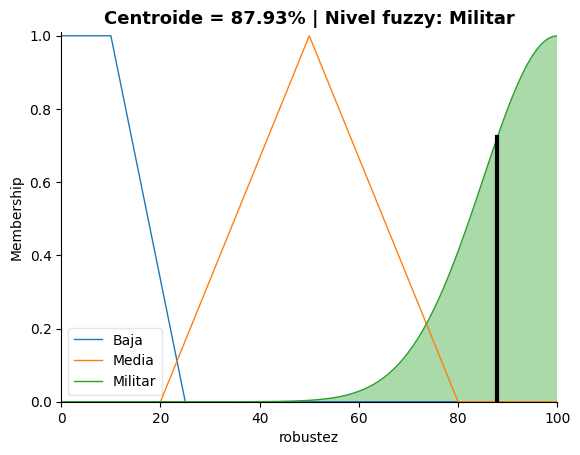

EVALUACIÓN DEL ALGORITMO

Algoritmo evaluado: AES_256
Valor del centroide fuzzy: 87.93%
Nivel fuzzy requerido: Militar
Clasificación inferida: NoRecomendado
Explicación: El algoritmo tiene nivel AltaSeguridad, pero el contexto requiere robustez Militar


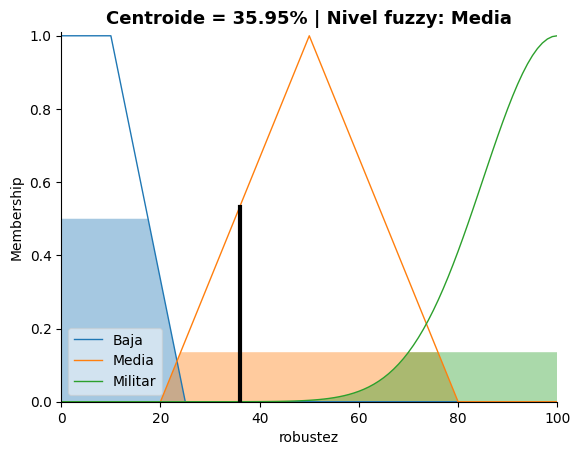

EVALUACIÓN DEL ALGORITMO

Algoritmo evaluado: SHA_256
Valor del centroide fuzzy: 35.95%
Nivel fuzzy requerido: Media
Clasificación inferida: RecomendadoIntegridad
Explicación: El algoritmo alcanza la robustez requerida. Nivel del algoritmo: AltaSeguridad; robustez requerida por fuzzy: Media. Adecuado para integridad o verificación criptográfica.


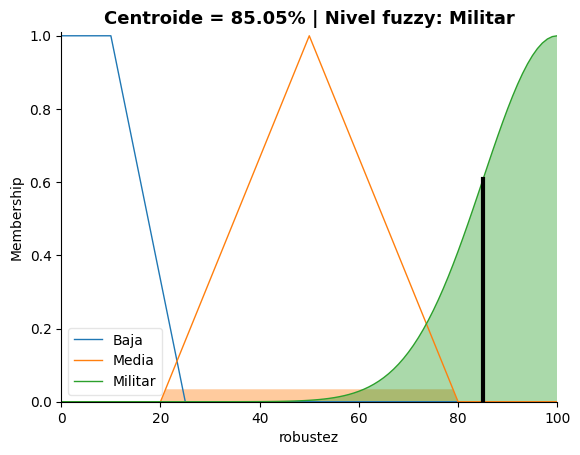

EVALUACIÓN DEL ALGORITMO

Algoritmo evaluado: Kyber
Valor del centroide fuzzy: 85.05%
Nivel fuzzy requerido: Militar
Clasificación inferida: RecomendadoPostCuantico
Explicación: El algoritmo alcanza o supera la robustez requerida. Nivel del algoritmo: PostCuanticoSeguro; robustez requerida por fuzzy: Militar. Adecuado para escenarios con amenaza cuántica.


In [107]:
# ============================================================
# CELDA FINAL - EVALUACIÓN PUNTUAL LIMPIA
# ============================================================

# Objetivo:
# - Ingresar uno o varios casos: recursos, sensibilidad y algoritmo.
# - Calcular robustez fuzzy por centroide.
# - Graficar el centroide.
# - Alimentar Experta con ontología + fuzzy.
# - Mostrar la clasificación del algoritmo consultado.
# ============================================================

import io
import contextlib


def normalizar_nombre_algoritmo(nombre):
    return texto_normalizado(nombre)


def obtener_algoritmos_disponibles(grafo):
    algoritmos = set()

    for sujeto in set(grafo.subjects(RDF.type, None)):
        clases = [
            limpiar_recurso(clase)
            for clase in grafo.objects(sujeto, RDF.type)
        ]

        if tiene_tipo_algoritmo(clases):
            algoritmos.add(limpiar_recurso(sujeto))

    return sorted(algoritmos)


def buscar_nombre_algoritmo(nombre_usuario, algoritmos_disponibles):
    nombre_usuario_norm = normalizar_nombre_algoritmo(nombre_usuario)

    for algoritmo in algoritmos_disponibles:
        if normalizar_nombre_algoritmo(algoritmo) == nombre_usuario_norm:
            return algoritmo

    for algoritmo in algoritmos_disponibles:
        if nombre_usuario_norm in normalizar_nombre_algoritmo(algoritmo):
            return algoritmo

    return None


def calcular_fuzzy_caso(valor_recursos, valor_sensibilidad):
    simulacion = ctrl.ControlSystemSimulation(sistema_control)

    simulacion.input["recursos"] = valor_recursos
    simulacion.input["sensibilidad"] = valor_sensibilidad

    simulacion.compute()

    valor_centroide = simulacion.output["robustez"]
    nivel = clasificar_robustez(valor_centroide)

    return simulacion, valor_centroide, nivel


def evaluar_algoritmo_limpio(valor_recursos, valor_sensibilidad, algoritmo_consultado):
    algoritmos_disponibles = obtener_algoritmos_disponibles(grafo_razonado)
    algoritmo_real = buscar_nombre_algoritmo(algoritmo_consultado, algoritmos_disponibles)

    if algoritmo_real is None:
        print(f"Algoritmo no encontrado en la ontología: {algoritmo_consultado}")
        print("Algoritmos disponibles:")
        for algoritmo in algoritmos_disponibles:
            print(f"- {algoritmo}")
        return None

    simulacion, valor_centroide, nivel_robustez_caso = calcular_fuzzy_caso(
        valor_recursos,
        valor_sensibilidad
    )

    robustez.view(sim=simulacion)
    plt.title(
        f"Centroide = {valor_centroide:.2f}% | Nivel fuzzy: {nivel_robustez_caso}",
        fontsize=13,
        fontweight="bold"
    )
    plt.show()

    engine_caso = SistemaExpertoCriptografia()
    engine_caso.reset()

    # Ocultar prints internos de carga e inferencia
    with contextlib.redirect_stdout(io.StringIO()):
        cargar_base_hechos(
            engine=engine_caso,
            grafo=grafo_razonado,
            robustez_fuzzy=nivel_robustez_caso,
            hechos_inferidos=hechos_inferidos
        )

        engine_caso.run()

    decision_final = None

    for _, hecho in engine_caso.facts.items():
        if isinstance(hecho, DecisionFinal):
            if normalizar_nombre_algoritmo(hecho["algoritmo"]) == normalizar_nombre_algoritmo(algoritmo_real):
                decision_final = hecho
                break

    print("======================================")
    print("EVALUACIÓN DEL ALGORITMO")
    print("======================================\n")

    print(f"Algoritmo evaluado: {algoritmo_real}")
    print(f"Valor del centroide fuzzy: {valor_centroide:.2f}%")
    print(f"Nivel fuzzy requerido: {nivel_robustez_caso}")

    if decision_final is None:
        print("Clasificación inferida: Sin decisión final")
    else:
        print(f"Clasificación inferida: {decision_final['decision']}")
        print(f"Explicación: {decision_final['explicacion']}")

    return {
        "algoritmo": algoritmo_real,
        "centroide": valor_centroide,
        "nivel_fuzzy": nivel_robustez_caso,
        "decision": decision_final["decision"] if decision_final else "Sin decisión final",
        "explicacion": decision_final["explicacion"] if decision_final else "No se generó conclusión"
    }


# ============================================================
# CASOS A EVALUAR
# ============================================================

casos_evaluacion = [
    {
        "recursos": 10,
        "sensibilidad": 9,
        "algoritmo": "AES256"
    },
    {
        "recursos": 80,
        "sensibilidad": 3,
        "algoritmo": "SHA256"
    },
    {
        "recursos": 35,
        "sensibilidad": 8,
        "algoritmo": "Kyber"
    }
]


# ============================================================
# EJECUCIÓN
# ============================================================

resultados_casos = []

for caso in casos_evaluacion:
    resultado = evaluar_algoritmo_limpio(
        valor_recursos=caso["recursos"],
        valor_sensibilidad=caso["sensibilidad"],
        algoritmo_consultado=caso["algoritmo"]
    )

    resultados_casos.append(resultado)